In [2]:
%pip install "numpy>=2.0,<2.3" --force-reinstall

  Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.5 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6
Note: you may need to restart the kernel to use updated packages.


In [1]:
import os
import sys
from pathlib import Path

import coffea.util
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display, Markdown

sidm_path = str(Path.cwd()).split('/sidm')[0]
if sidm_path not in sys.path:
    sys.path.insert(1, sidm_path)

from sidm.tools import utilities

utilities.set_plot_style()
%matplotlib inline

In [2]:
cwd = Path.cwd()
if (cwd / 'Mother_Tracking_LJ_Kinematics_BKG').exists():
    study_dir = cwd
elif (cwd / 'studies' / 'Mother_Tracking').exists():
    study_dir = cwd / 'studies' / 'Mother_Tracking'
else:
    raise RuntimeError(f'Cannot locate studies/Mother_Tracking from {cwd}')

repo_dir = study_dir.parents[1]
mother_dir = study_dir / 'Mother_Tracking_LJ_Kinematics_BKG'
kin_dir = study_dir / 'Mother_Tracking_LJ_Kinematics_BKG'

channels = {
    '1 Mu-LJ': 'data_control_region_1muLj_cosmic_veto',
    '1 EGM-LJ': 'data_control_region_1egmLj_cosmic_veto',
    '1 Mu-LJ and 1 EGM-LJ': 'data_control_region_1muLj_1egmLj_cosmic_veto',
    '2 Mu-LJ': 'data_control_region_2muLj_cosmic_veto',
}

QCD = [
    'QCD_Pt15To20', 'QCD_Pt20To30', 'QCD_Pt30To50', 'QCD_Pt50To80',
    'QCD_Pt80To120', 'QCD_Pt120To170', 'QCD_Pt170To300', 'QCD_Pt300To470',
    'QCD_Pt470To600', 'QCD_Pt600To800', 'QCD_Pt800To1000', 'QCD_Pt1000',
]
DY = ['DYJetsToMuMu_M10to50', 'DYJetsToMuMu_M50']
TT = ['TTJets']
Diboson = ['WW', 'WZ', 'ZZ']

background_groups = {
    'QCD': QCD,
    'DY': DY,
    'TT': TT,
    'Diboson': Diboson,
}

all_background_samples = sorted({sample for samples in background_groups.values() for sample in samples})
mother_hist_name = 'fs_gen_mother_id'

print('study_dir =', study_dir)
print('mother_dir =', mother_dir)
print('kin_dir =', kin_dir)

study_dir = /home/cms-jovyan/workspace/CMS-SIDM-PR/sidm/studies/Mother_Tracking
mother_dir = /home/cms-jovyan/workspace/CMS-SIDM-PR/sidm/studies/Mother_Tracking/Mother_Tracking_LJ_Kinematics_BKG
kin_dir = /home/cms-jovyan/workspace/CMS-SIDM-PR/sidm/studies/Mother_Tracking/Mother_Tracking_LJ_Kinematics_BKG


In [3]:
def load_sample_output(path, sample):
    output = coffea.util.load(path)
    if 'out' in output:
        return output['out'][sample]
    return output[sample]


def load_outputs(directory, samples):
    out = {}
    missing = []
    for sample in samples:
        path = Path(directory) / f'{sample}.coffea'
        if not path.exists():
            missing.append(sample)
            continue
        out[sample] = load_sample_output(path, sample)
    if missing:
        print(f'Missing {len(missing)} samples in {directory}: {missing}')
    return out


mother_out = load_outputs(mother_dir, all_background_samples)
kin_out = load_outputs(kin_dir, all_background_samples)
print(f'Loaded {len(mother_out)} MotherTracking samples')
print(f'Loaded {len(kin_out)} LJKinematics samples')

Loaded 18 MotherTracking samples
Loaded 18 LJKinematics samples


In [4]:
MOTHER_CATEGORY_IDS = {
    'W': (24,),
    'Z': (23,),
    'D': (411, 421, 423, 431),
    'B': (511, 521, 531, 541),
    'quark/gluon': (1, 2, 3, 4, 5, 6, 9, 21),
    'pion': (111, 211),
    'eta/omega': (221, 223),
    'J/psi': (443,),
    'electron': (11,),
    'muon': (13,),
}
CATEGORY_ORDER = list(MOTHER_CATEGORY_IDS) + ['other']
CATEGORY_COLORS = {
    'W': '#1f77b4',
    'Z': '#ff7f0e',
    'D': '#2ca02c',
    'B': '#d62728',
    'quark/gluon': '#9467bd',
    'pion': '#8c564b',
    'eta/omega': '#e377c2',
    'J/psi': '#7f7f7f',
    'electron': '#bcbd22',
    'muon': '#17becf',
    'other': '#c7c7c7',
}
CHANNEL_COLORS = {
    '1 Mu-LJ': 'r',
    '1 EGM-LJ': 'g',
    '1 Mu-LJ and 1 EGM-LJ': 'b',
    '2 Mu-LJ': 'darkorange',
}


def hist_values_1d(hist_obj):
    values = np.asarray(hist_obj.values(), dtype=float)
    variances = hist_obj.variances()
    variances = np.zeros_like(values) if variances is None else np.asarray(variances, dtype=float)
    centers = np.asarray(hist_obj.axes[0].centers, dtype=float)
    return centers, values, variances


def group_hist(out, samples, channel, hist_name):
    total = None
    used = []
    skipped = []
    for sample in samples:
        if sample not in out:
            skipped.append((sample, 'not loaded'))
            continue
        hists = out[sample]['hists']
        if hist_name not in hists:
            skipped.append((sample, f'missing {hist_name}'))
            continue
        try:
            h = hists[hist_name][{'channel': channel}]
        except Exception as exc:
            skipped.append((sample, f'cannot slice {channel}: {exc}'))
            continue
        total = h.copy() if total is None else total + h
        used.append(sample)
    if skipped:
        print(f'{hist_name} / {channel}: skipped {len(skipped)} samples')
        for sample, reason in skipped[:5]:
            print(f'  {sample}: {reason}')
        if len(skipped) > 5:
            print('  ...')
    return total, used


def total_yield(hist_obj):
    return float(np.asarray(hist_obj.values(), dtype=float).sum())


def channel_yield_table(out, samples, hist_name=mother_hist_name):
    rows = []
    for channel_label, channel in channels.items():
        h, used = group_hist(out, samples, channel, hist_name)
        rows.append({
            'channel': channel_label,
            'yield': np.nan if h is None else total_yield(h),
            'n_samples': len(used),
        })
    table = pd.DataFrame(rows).set_index('channel')
    ref = table.loc['1 Mu-LJ', 'yield']
    table['ratio_to_1MuLJ'] = table['yield'] / ref if ref > 0 else np.nan
    return table


def plot_channel_yield_ratios(table, title):
    ax = table['ratio_to_1MuLJ'].plot(kind='bar', figsize=(18, 8), color=[CHANNEL_COLORS[idx] for idx in table.index])
    ax.axhline(1.0, color='black', linestyle='--', linewidth=2)
    ax.set_ylabel('Yield ratio to 1 Mu-LJ')
    ax.set_title(title)
    plt.tight_layout()
    return ax


def mother_category_yields(hist_obj):
    centers, values, _ = hist_values_1d(hist_obj)
    pdgids = np.floor(centers).astype(int)
    yields = {}
    used_mask = np.zeros_like(pdgids, dtype=bool)
    for category, ids in MOTHER_CATEGORY_IDS.items():
        mask = np.isin(pdgids, ids)
        yields[category] = values[mask].sum()
        used_mask |= mask
    yields['other'] = values[~used_mask].sum()
    return pd.Series(yields)[CATEGORY_ORDER]


def mother_composition_table(out, samples):
    rows = {}
    for channel_label, channel in channels.items():
        h, used = group_hist(out, samples, channel, mother_hist_name)
        if h is None:
            rows[channel_label] = pd.Series(np.nan, index=CATEGORY_ORDER)
            continue
        yields = mother_category_yields(h)
        total = yields.sum()
        rows[channel_label] = 100.0 * yields / total if total > 0 else yields * np.nan
    return pd.DataFrame(rows).T[CATEGORY_ORDER]


def plot_mother_composition(table, title):
    colors = [CATEGORY_COLORS[category] for category in table.columns]
    ax = table.plot(kind='bar', stacked=True, figsize=(30, 15), width=0.8, color=colors)
    ax.set_ylabel('Mother composition [%]')
    ax.set_ylim(0, 100)
    ax.set_title(title)
    ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', title='Mother', fontsize=25)
    plt.tight_layout()
    return ax




def hist_edges_1d(hist_obj):
    values = np.asarray(hist_obj.values(), dtype=float)
    variances = hist_obj.variances()
    variances = np.zeros_like(values) if variances is None else np.asarray(variances, dtype=float)
    edges = np.asarray(hist_obj.axes[0].edges, dtype=float)
    return edges, values, variances


def _rebin_1d(edges, values, variances, factor=1):
    factor = int(factor)
    if factor <= 1:
        return edges, values, variances
    n_bins = len(values)
    grouped_edges = [edges[0]]
    grouped_values = []
    grouped_variances = []
    for start in range(0, n_bins, factor):
        stop = min(start + factor, n_bins)
        grouped_values.append(values[start:stop].sum())
        grouped_variances.append(variances[start:stop].sum())
        grouped_edges.append(edges[stop])
    return np.asarray(grouped_edges), np.asarray(grouped_values), np.asarray(grouped_variances)


def normalized_shape(hist_obj, rebin=1):
    edges, values, variances = hist_edges_1d(hist_obj)
    edges, values, variances = _rebin_1d(edges, values, variances, factor=rebin)
    total = values.sum()
    if total <= 0:
        return edges, values * np.nan, variances * np.nan
    return edges, values / total, np.sqrt(np.maximum(variances, 0.0)) / total


def projected_shape_2d(hist_obj, axis_name, rebin=1):
    axis_names = [axis.name for axis in hist_obj.axes]
    if axis_name not in axis_names:
        raise KeyError(f'{axis_name} not found in axes {axis_names}')
    project_axis = axis_names.index(axis_name)
    values = np.asarray(hist_obj.values(), dtype=float)
    variances = hist_obj.variances()
    variances = np.zeros_like(values) if variances is None else np.asarray(variances, dtype=float)
    sum_axes = tuple(i for i in range(values.ndim) if i != project_axis)
    projected_values = values.sum(axis=sum_axes)
    projected_variances = variances.sum(axis=sum_axes)
    edges = np.asarray(hist_obj.axes[project_axis].edges, dtype=float)
    edges, projected_values, projected_variances = _rebin_1d(
        edges,
        projected_values,
        projected_variances,
        factor=rebin,
    )
    total = projected_values.sum()
    if total <= 0:
        return edges, projected_values * np.nan, projected_variances * np.nan
    return edges, projected_values / total, np.sqrt(np.maximum(projected_variances, 0.0)) / total


def _bin_centers(edges):
    return 0.5 * (edges[:-1] + edges[1:])


def add_shape_error_points(ax, edges, values, errors, color):
    valid = np.isfinite(values) & np.isfinite(errors) & (errors > 0)
    if not np.any(valid):
        return

    centers = _bin_centers(edges)
    ax.errorbar(
        centers[valid],
        values[valid],
        yerr=errors[valid],
        fmt='o',
        markersize=5,
        markerfacecolor=color,
        markeredgecolor=color,
        ecolor=color,
        elinewidth=1.5,
        capsize=2,
        linestyle='none',
        zorder=5,
    )


def _finish_shape_axis(ax, edges_by_channel, xlabel, ylabel, title, ylim=None, xlim=None, logy=False):
    finite_edges = [edges for edges in edges_by_channel if len(edges) > 1 and np.all(np.isfinite(edges))]
    if xlim is not None:
        ax.set_xlim(*xlim)
    elif finite_edges:
        ax.set_xlim(min(edges[0] for edges in finite_edges), max(edges[-1] for edges in finite_edges))
    ax.margins(x=0)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.grid(True, linestyle=':', alpha=0.3)
    ax.legend(frameon=False)
    if logy:
        ax.set_yscale('log')
        positive = []
        for patch in ax.patches:
            y = np.asarray(patch.get_verts()[:, 1], dtype=float)
            positive.extend(y[np.isfinite(y) & (y > 0)])
        if positive and ylim is None:
            ax.set_ylim(min(positive) * 0.5, max(positive) * 5.0)
    if ylim is not None:
        ax.set_ylim(*ylim)
    plt.tight_layout()


def plot_shape(channel_labels, samples, variable, title=None, ylim=None, xlim=None, logy=False, show_errors=False, rebin=1):
    fig, ax = plt.subplots(figsize=(24, 12))
    edges_by_channel = []
    for channel_label in channel_labels:
        channel = channels[channel_label]
        h, used = group_hist(kin_out, samples, channel, variable)
        if h is None:
            print(f'Skip {channel_label}: {variable} not available')
            continue
        edges, shape, err = normalized_shape(h, rebin=rebin)
        color = CHANNEL_COLORS[channel_label]
        ax.stairs(
            shape,
            edges,
            baseline=0,
            label=channel_label,
            color=color,
            linewidth=3,
        )
        if show_errors:
            add_shape_error_points(ax, edges, shape, err, color)
        edges_by_channel.append(edges)
    _finish_shape_axis(
        ax,
        edges_by_channel,
        xlabel=variable,
        ylabel='Normalized entries',
        title=title or variable,
        ylim=ylim,
        xlim=xlim,
        logy=logy,
    )
    return fig, ax


def plot_shape_2d_projection(channel_labels, samples, variable, axis_name, xlabel=None, title=None, ylim=None, xlim=None, logy=False, show_errors=False, rebin=1):
    fig, ax = plt.subplots(figsize=(24, 12))
    edges_by_channel = []
    for channel_label in channel_labels:
        channel = channels[channel_label]
        h, used = group_hist(kin_out, samples, channel, variable)
        if h is None:
            print(f'Skip {channel_label}: {variable} not available')
            continue
        edges, shape, err = projected_shape_2d(h, axis_name, rebin=rebin)
        color = CHANNEL_COLORS[channel_label]
        ax.stairs(
            shape,
            edges,
            baseline=0,
            label=channel_label,
            color=color,
            linewidth=3,
        )
        if show_errors:
            add_shape_error_points(ax, edges, shape, err, color)
        edges_by_channel.append(edges)
    _finish_shape_axis(
        ax,
        edges_by_channel,
        xlabel=xlabel or axis_name,
        ylabel='Normalized entries',
        title=title or f'{variable} projected to {axis_name}',
        ylim=ylim,
        xlim=xlim,
        logy=logy,
    )
    return fig, ax


def mother_composition_table_for_process(out, group):
    return mother_composition_table(out, background_groups[group])


def yield_table_for_process(out, group):
    return channel_yield_table(out, background_groups[group])


def plot_group_shape(channel_labels, group, variable, title=None, ylim=None, xlim=None, logy=False, show_errors=False, rebin=1):
    return plot_shape(
        channel_labels,
        background_groups[group],
        variable,
        title=title or f'{group}: {variable}',
        ylim=ylim,
        xlim=xlim,
        logy=logy,
        show_errors=show_errors,
        rebin=rebin,
    )


REGION_SUFFIXES = {
    'inclusive': '',
    'both_pass': '_both_pass',
    'both_fail': '_both_fail',
}

REGION_LABELS = {
    'inclusive': 'Inclusive',
    'both_pass': 'Signal-like',
    'both_fail': 'Bkg-like',
}


def channel_for_region(channel_label, region='inclusive'):
    if region not in REGION_SUFFIXES:
        raise KeyError(f'Unknown region: {region}')
    return f'{channels[channel_label]}{REGION_SUFFIXES[region]}'


def mother_composition_table_for_region(out, samples, region='inclusive'):
    rows = {}
    for channel_label in channels:
        channel = channel_for_region(channel_label, region)
        h, used = group_hist(out, samples, channel, mother_hist_name)
        if h is None:
            rows[channel_label] = pd.Series(np.nan, index=CATEGORY_ORDER)
            continue
        yields = mother_category_yields(h)
        total = yields.sum()
        rows[channel_label] = 100.0 * yields / total if total > 0 else yields * np.nan
    return pd.DataFrame(rows).T[CATEGORY_ORDER]


def plot_shape_for_region(
    channel_labels,
    samples,
    variable,
    region='inclusive',
    title=None,
    ylim=None,
    xlim=None,
    logy=False,
    show_errors=True,
    rebin=1,
):
    fig, ax = plt.subplots(figsize=(24, 12))
    edges_by_channel = []
    for channel_label in channel_labels:
        channel = channel_for_region(channel_label, region)
        h, used = group_hist(kin_out, samples, channel, variable)
        if h is None:
            print(f'Skip {channel_label}: {variable} not available in {REGION_LABELS[region]}')
            continue
        edges, shape, err = normalized_shape(h, rebin=rebin)
        color = CHANNEL_COLORS[channel_label]
        ax.stairs(
            shape,
            edges,
            baseline=0,
            label=channel_label,
            color=color,
            linewidth=3,
        )
        if show_errors:
            add_shape_error_points(ax, edges, shape, err, color)
        edges_by_channel.append(edges)
    _finish_shape_axis(
        ax,
        edges_by_channel,
        xlabel=variable,
        ylabel='Normalized entries',
        title=title or f'{REGION_LABELS[region]}: {variable}',
        ylim=ylim,
        xlim=xlim,
        logy=logy,
    )
    return fig, ax


QCD


,W,Z,D,B,quark/gluon,pion,eta/omega,J/psi,electron,muon,other
1 Mu-LJ,0.0,0.0,25.71,24.61,14.28,15.75,2.05,8.61,0.0,0.04,8.96
1 EGM-LJ,0.0,0.0,6.08,18.17,10.00,56.61,2.74,0.04,0.0,0.00,6.36
1 Mu-LJ and 1 EGM-LJ,0.0,0.0,22.55,24.29,6.88,29.66,2.84,5.77,0.0,0.01,8.01
2 Mu-LJ,0.0,0.0,31.34,29.66,3.22,20.90,1.59,4.93,0.0,0.05,8.32


DY


,W,Z,D,B,quark/gluon,pion,eta/omega,J/psi,electron,muon,other
1 Mu-LJ,0.0,97.26,0.37,0.12,1.09,1.01,0.06,0.0,0.0,0.0,0.1
1 EGM-LJ,0.0,0.63,0.01,0.01,0.02,86.92,12.42,0.0,0.0,0.0,0.0
1 Mu-LJ and 1 EGM-LJ,0.0,60.58,2.88,0.00,3.85,27.88,4.81,0.0,0.0,0.0,0.0
2 Mu-LJ,0.0,99.94,0.02,0.01,0.01,0.01,0.00,0.0,0.0,0.0,0.0


TT


,W,Z,D,B,quark/gluon,pion,eta/omega,J/psi,electron,muon,other
1 Mu-LJ,13.45,0.0,28.49,30.59,1.61,8.25,1.08,4.79,0.08,5.21,6.45
1 EGM-LJ,38.79,0.0,4.81,12.15,1.76,11.68,1.12,0.35,17.31,0.53,11.50
1 Mu-LJ and 1 EGM-LJ,17.21,0.0,24.75,26.15,1.72,9.69,1.20,3.75,5.98,2.03,7.52
2 Mu-LJ,12.52,0.0,28.68,27.04,1.09,11.07,2.54,4.54,0.18,4.54,7.80


Diboson


,W,Z,D,B,quark/gluon,pion,eta/omega,J/psi,electron,muon,other
1 Mu-LJ,27.68,23.51,10.12,6.80,1.17,4.22,1.07,1.47,0.01,16.75,7.20
1 EGM-LJ,35.46,7.21,1.47,0.72,1.47,12.58,1.45,0.00,16.77,8.10,14.76
1 Mu-LJ and 1 EGM-LJ,20.51,26.78,11.11,5.82,1.14,7.11,1.38,1.40,7.40,11.28,6.08
2 Mu-LJ,24.39,33.95,11.55,8.77,0.00,5.63,1.39,0.00,0.00,14.32,0.00


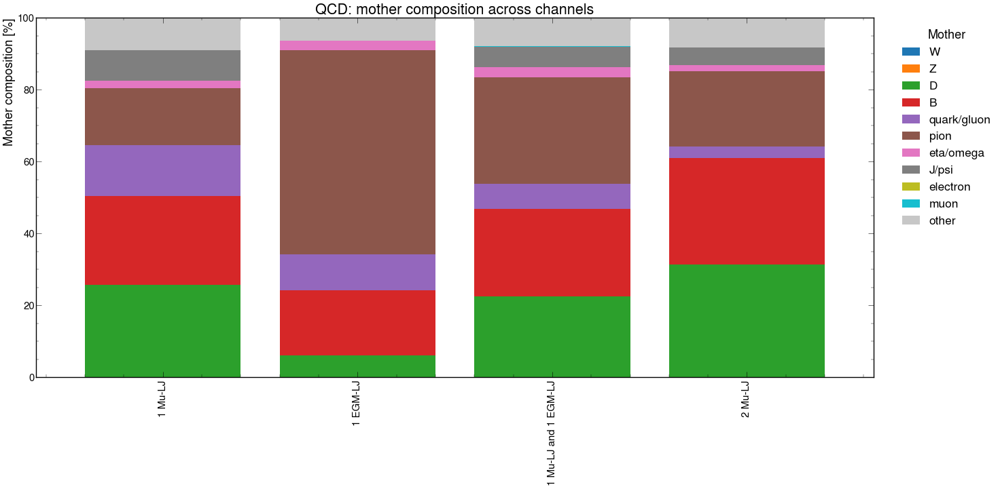

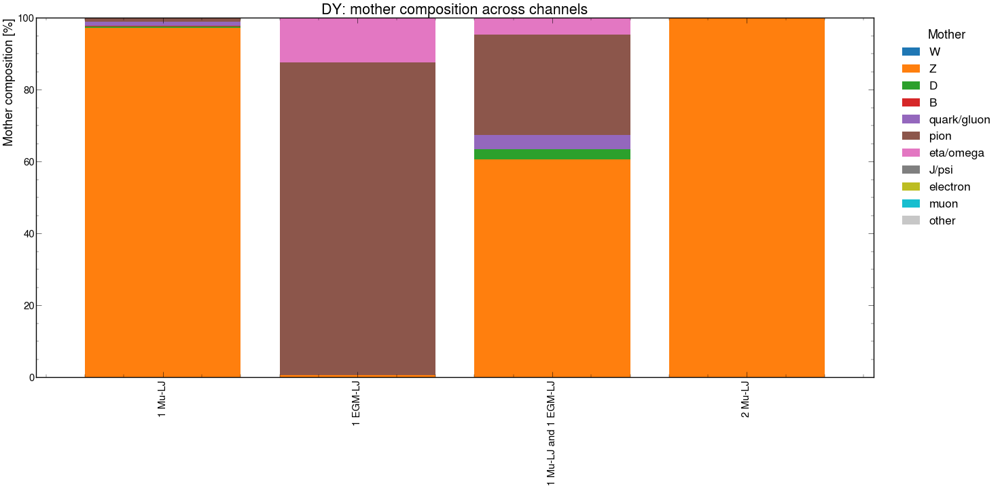

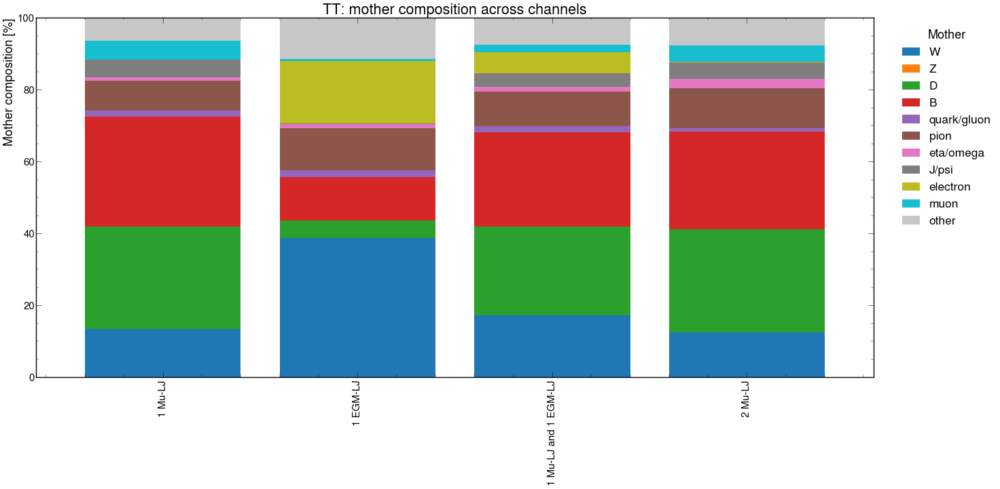

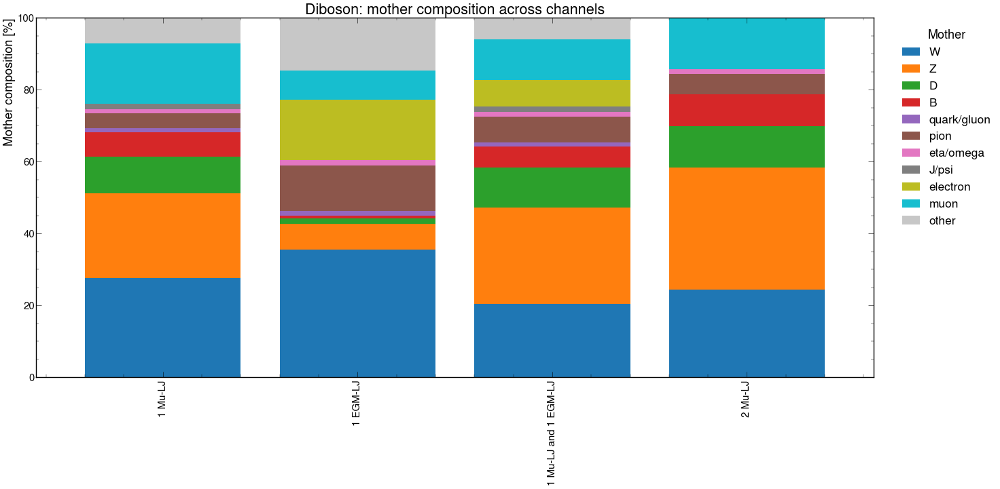

In [5]:
mother_tables = {}
for group in background_groups:
    table = mother_composition_table_for_process(mother_out, group)
    mother_tables[group] = table
    print(group)
    display(table.round(2))
    plot_mother_composition(table, f'{group}: mother composition across channels')

## QCD: Signal-like mother composition

,W,Z,D,B,quark/gluon,pion,eta/omega,J/psi,electron,muon,other
1 Mu-LJ,0.0,0.0,18.72,18.95,29.90,14.11,1.98,5.20,0.00,0.15,10.98
1 EGM-LJ,0.0,0.0,0.39,3.42,24.52,67.28,3.50,0.00,0.00,0.00,0.89
1 Mu-LJ and 1 EGM-LJ,0.0,0.0,5.24,7.97,13.40,36.93,0.00,21.96,0.00,0.00,14.50
2 Mu-LJ,0.0,0.0,14.29,14.29,0.00,42.86,0.00,0.00,14.29,0.00,14.29


## DY: Signal-like mother composition

,W,Z,D,B,quark/gluon,pion,eta/omega,J/psi,electron,muon,other
1 Mu-LJ,0.0,100.00,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0
1 EGM-LJ,0.0,4.97,0.01,0.0,0.12,94.87,0.03,0.0,0.0,0.0,0.0
1 Mu-LJ and 1 EGM-LJ,0.0,75.00,0.00,0.0,0.00,25.00,0.00,0.0,0.0,0.0,0.0
2 Mu-LJ,0.0,100.00,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0


## TT: Signal-like mother composition

,W,Z,D,B,quark/gluon,pion,eta/omega,J/psi,electron,muon,other
1 Mu-LJ,18.56,0.0,24.55,28.74,0.00,7.78,0.6,4.79,0.00,7.19,7.78
1 EGM-LJ,36.36,0.0,5.19,2.60,12.99,10.39,1.3,0.00,12.99,6.49,11.69
1 Mu-LJ and 1 EGM-LJ,25.00,0.0,0.00,0.00,0.00,75.00,0.0,0.00,0.00,0.00,0.00
2 Mu-LJ,66.67,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,33.33,0.00


## Diboson: Signal-like mother composition

,W,Z,D,B,quark/gluon,pion,eta/omega,J/psi,electron,muon,other
1 Mu-LJ,36.69,19.98,5.0,3.77,1.85,0.62,0.0,2.47,0.0,18.26,11.38
1 EGM-LJ,22.45,1.99,0.0,0.00,2.09,30.61,0.0,0.00,0.0,26.56,16.29
1 Mu-LJ and 1 EGM-LJ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2 Mu-LJ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## QCD: Bkg-like mother composition

,W,Z,D,B,quark/gluon,pion,eta/omega,J/psi,electron,muon,other
1 Mu-LJ,0.0,0.0,27.49,26.36,10.41,16.53,2.26,8.31,0.0,0.04,8.60
1 EGM-LJ,0.0,0.0,9.39,29.22,5.62,44.47,3.39,0.07,0.0,0.00,7.84
1 Mu-LJ and 1 EGM-LJ,0.0,0.0,23.63,28.02,6.15,27.58,2.30,6.39,0.0,0.01,5.93
2 Mu-LJ,0.0,0.0,33.13,29.36,2.98,20.72,1.20,4.53,0.0,0.02,8.05


## DY: Bkg-like mother composition

,W,Z,D,B,quark/gluon,pion,eta/omega,J/psi,electron,muon,other
1 Mu-LJ,0.0,81.49,1.40,0.28,3.65,12.34,0.28,0.0,0.0,0.0,0.56
1 EGM-LJ,0.0,0.05,0.01,0.01,0.01,66.63,33.29,0.0,0.0,0.0,0.00
1 Mu-LJ and 1 EGM-LJ,0.0,8.33,50.00,16.67,16.67,0.00,8.33,0.0,0.0,0.0,0.00
2 Mu-LJ,0.0,100.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00


## TT: Bkg-like mother composition

,W,Z,D,B,quark/gluon,pion,eta/omega,J/psi,electron,muon,other
1 Mu-LJ,7.84,0.0,32.32,33.55,1.78,9.69,1.24,5.30,0.03,3.00,5.25
1 EGM-LJ,31.71,0.0,7.96,24.43,0.94,10.80,1.48,0.81,12.69,0.00,9.18
1 Mu-LJ and 1 EGM-LJ,13.66,0.0,25.89,27.07,1.43,12.04,1.19,4.37,5.30,1.62,7.42
2 Mu-LJ,7.43,0.0,29.74,30.86,0.74,14.87,3.72,3.72,0.00,2.23,6.69


## Diboson: Bkg-like mother composition

,W,Z,D,B,quark/gluon,pion,eta/omega,J/psi,electron,muon,other
1 Mu-LJ,6.47,3.14,32.53,21.98,1.75,15.37,4.19,4.42,0.00,3.23,6.91
1 EGM-LJ,34.00,8.72,4.47,2.18,0.00,12.43,0.00,0.00,19.30,1.09,17.81
1 Mu-LJ and 1 EGM-LJ,24.08,0.00,34.45,20.74,0.00,0.00,0.00,0.00,20.74,0.00,0.00
2 Mu-LJ,0.00,0.00,42.86,57.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00


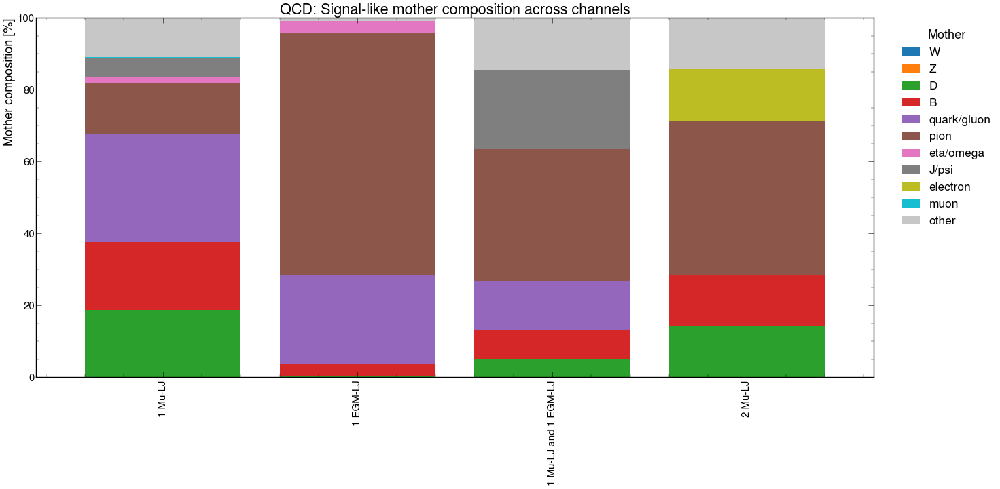

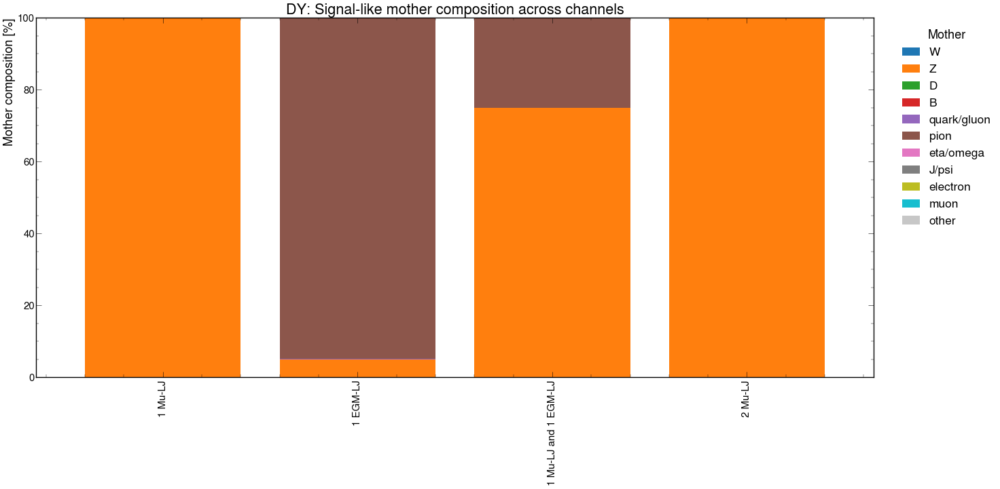

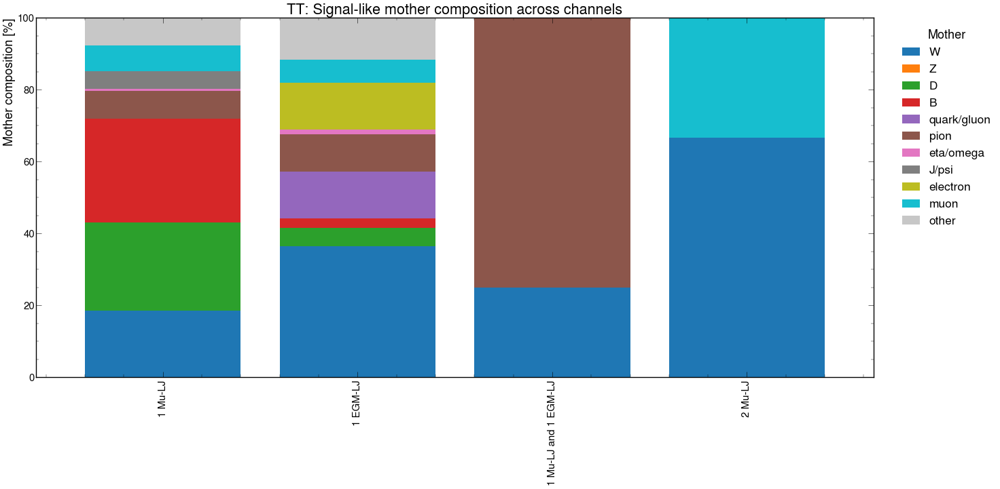

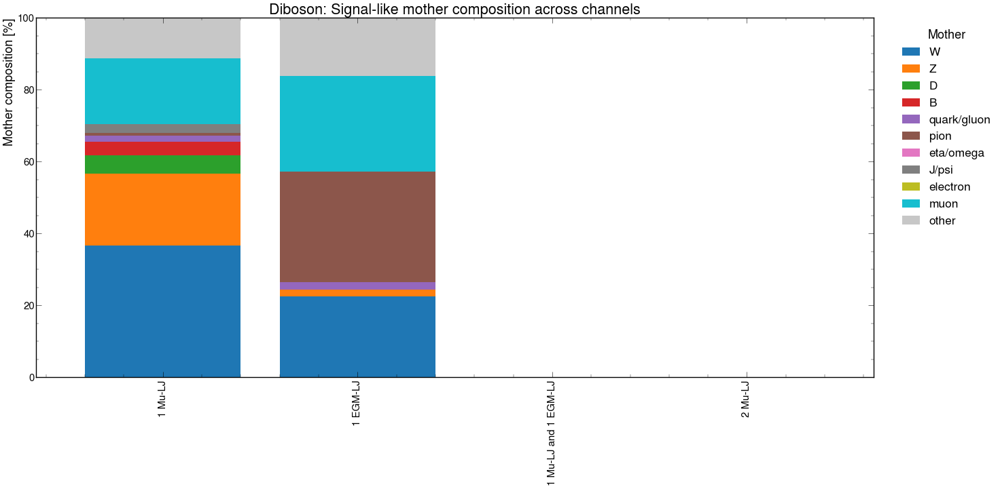

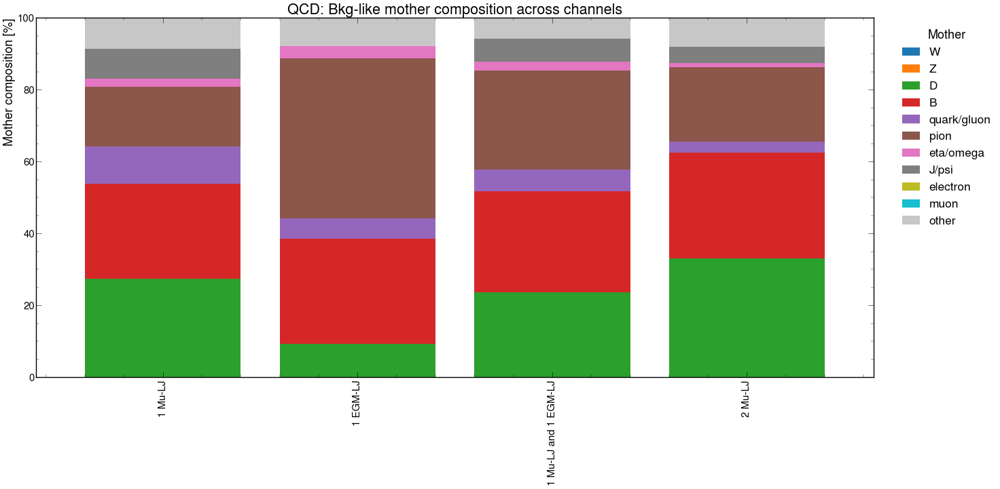

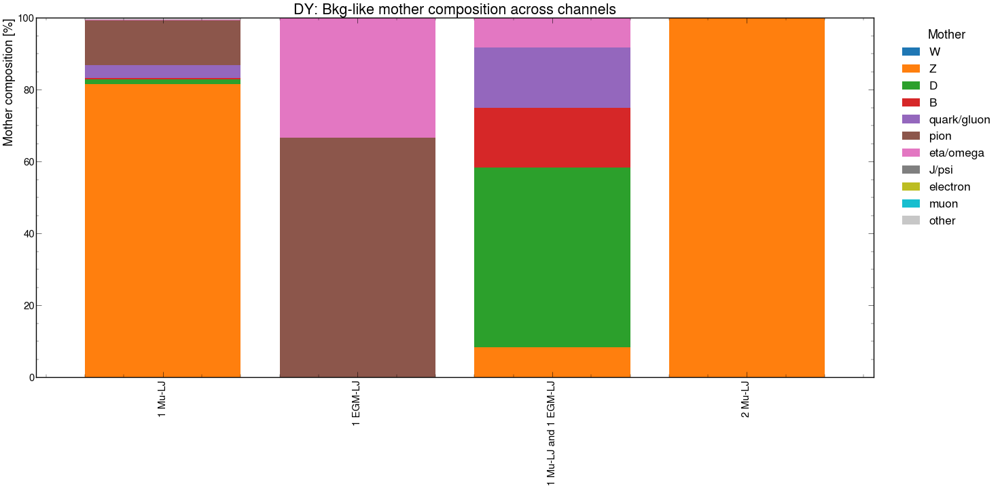

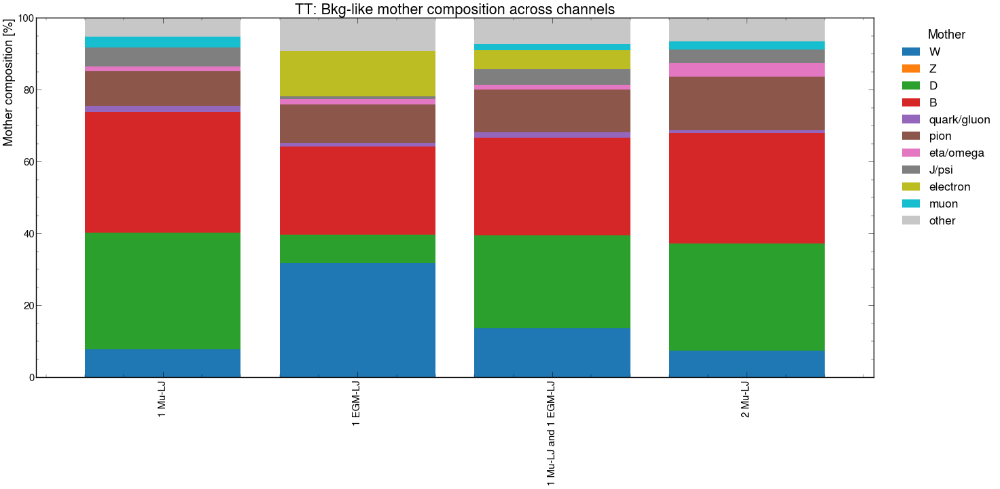

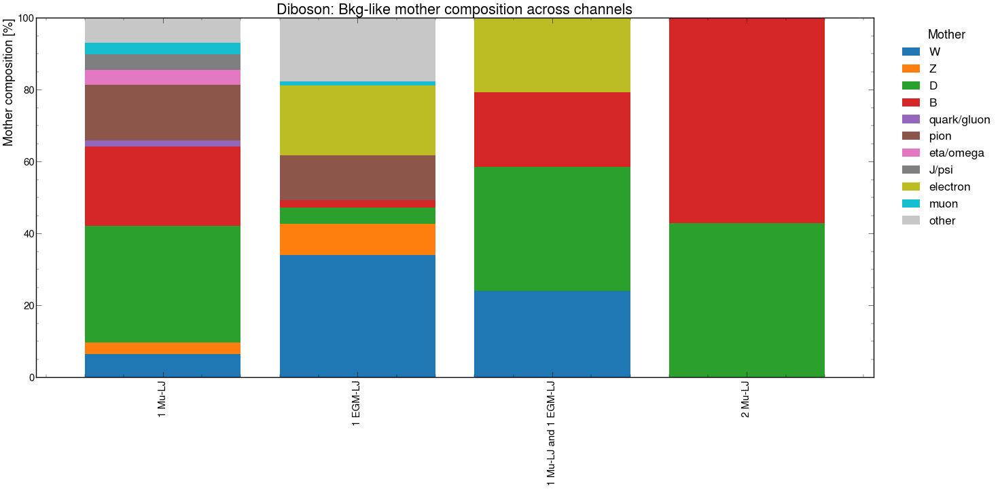

In [6]:
region_mother_tables = {}

for region in ['both_pass', 'both_fail']:
    region_mother_tables[region] = {}
    for group in background_groups:
        table = mother_composition_table_for_region(mother_out, background_groups[group], region)
        region_mother_tables[region][group] = table
        display(Markdown(f"## {group}: {REGION_LABELS[region]} mother composition"))
        display(table.round(2))
        plot_mother_composition(
            table,
            f'{group}: {REGION_LABELS[region]} mother composition across channels',
        )


In [7]:
mu_lj_variables = [
    'mu_lj_pt',
    'mu_lj_eta',
    'mu_lj_phi',
    'mu_lj_mass_small',
    'mu_lj_iso',
    'mu_lj_dRSpread',
    'mu_lj_muonN',
    'mu_lj_pfMu_n',
    'mu_lj_dsaMu_n',
]

egm_lj_variables = [
    'egm_lj_pt',
    'egm_lj_eta',
    'egm_lj_phi',
    'egm_lj_mass_small',
    'egm_lj_iso',
    'egm_lj_dRSpread',
    'egm_lj_electronN',
    'egm_lj_photonN',
]

mu_channels = ['1 Mu-LJ', '1 Mu-LJ and 1 EGM-LJ', '2 Mu-LJ']
egm_channels = ['1 EGM-LJ', '1 Mu-LJ and 1 EGM-LJ']

PLOT_OPTIONS = {
    'mu_lj_mass_small': {'xlim': (0, 6)},
    'egm_lj_mass_small': {'xlim': (0, 6)},
    'mu_lj_dRSpread': {'rebin': 5},
    'egm_lj_dRSpread': {'rebin': 5},
    'mu_lj_pt': {'xlim': (0, 200)},
    'egm_lj_pt': {'xlim': (0, 200)},
}

/tmp/ipykernel_3579/3446918125.py:247: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(24, 12))


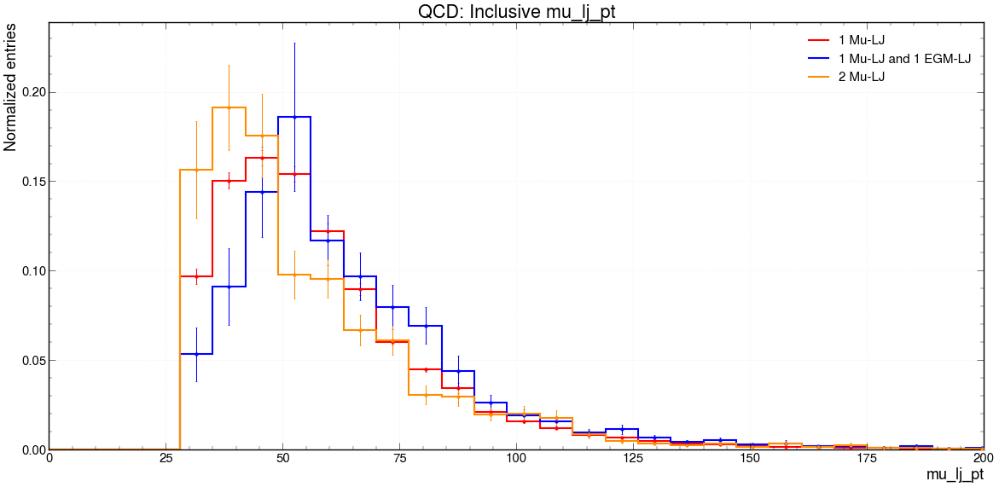

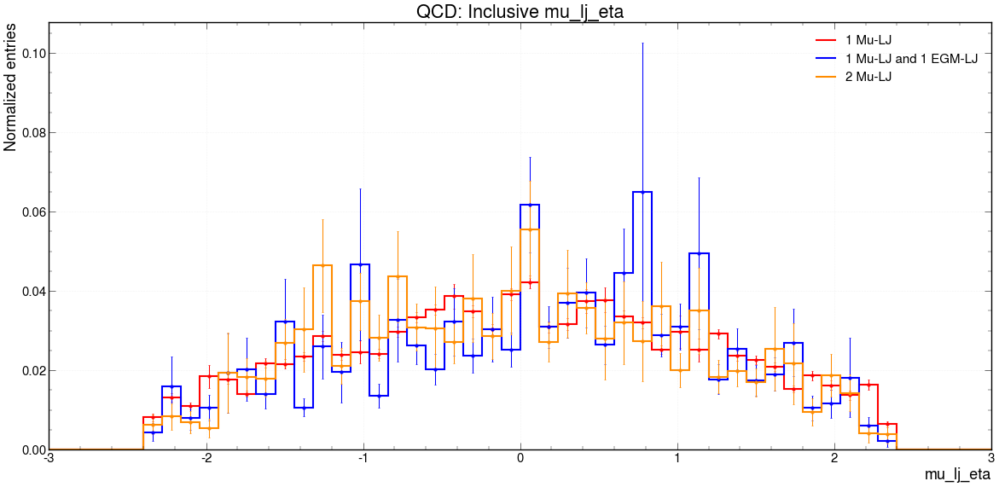

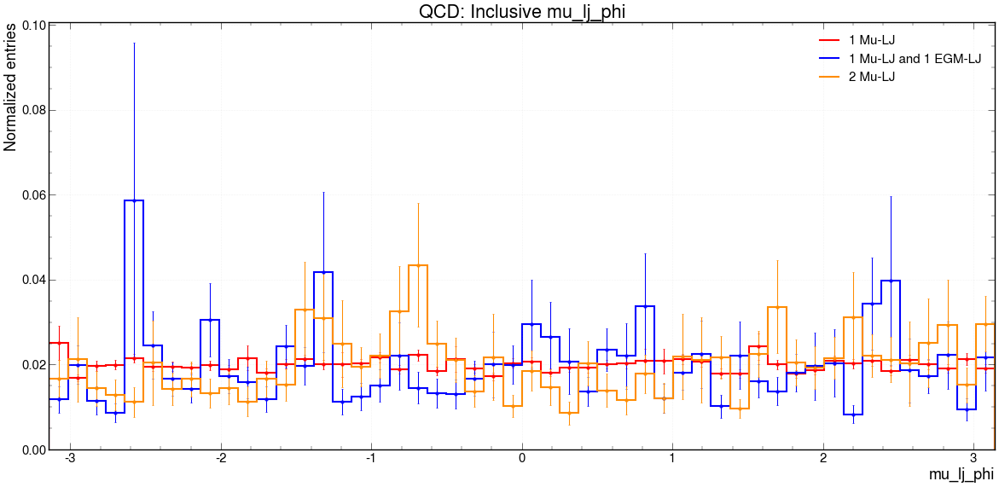

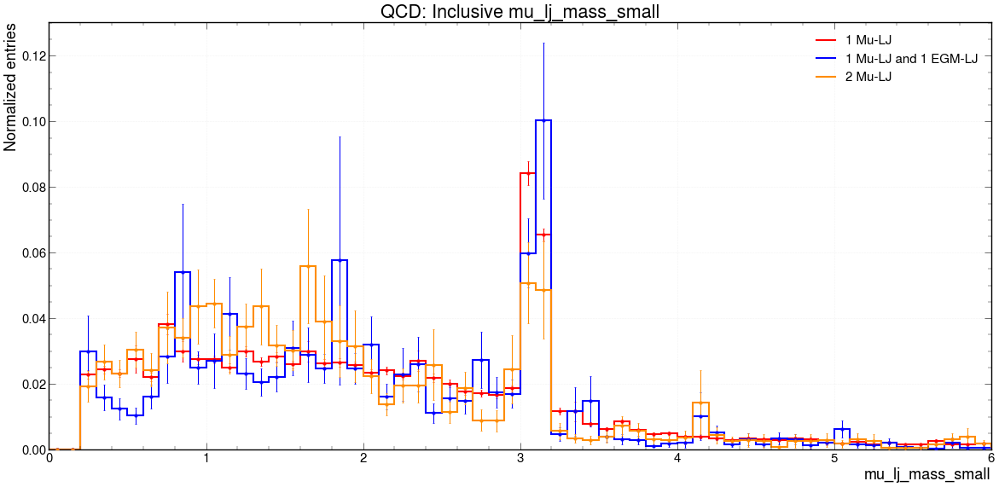

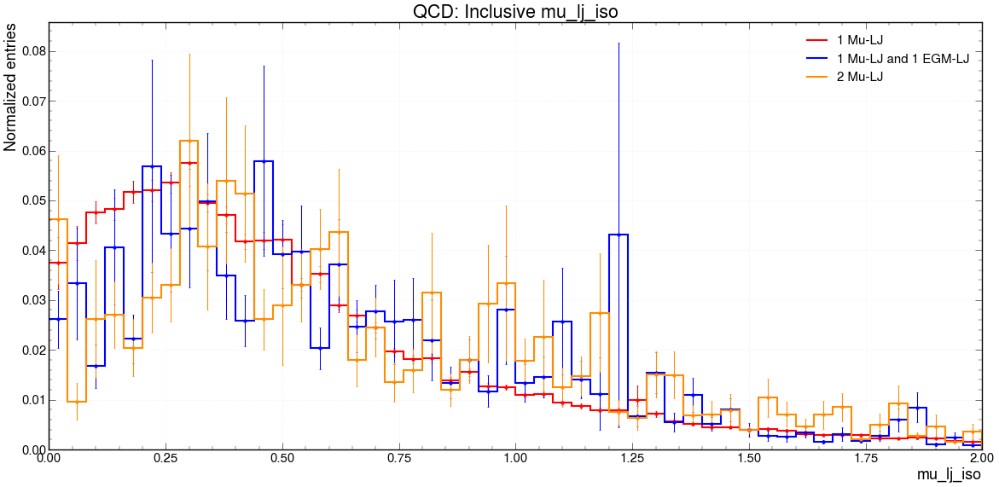

...

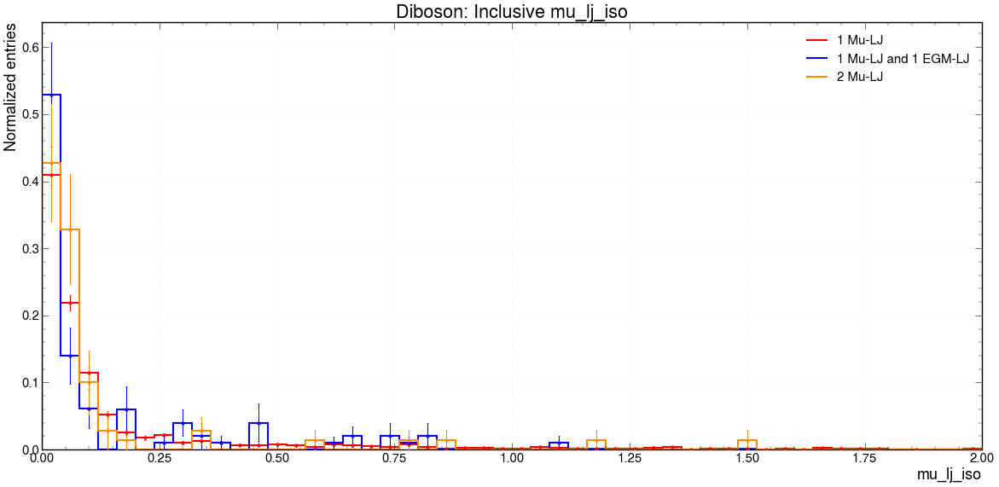

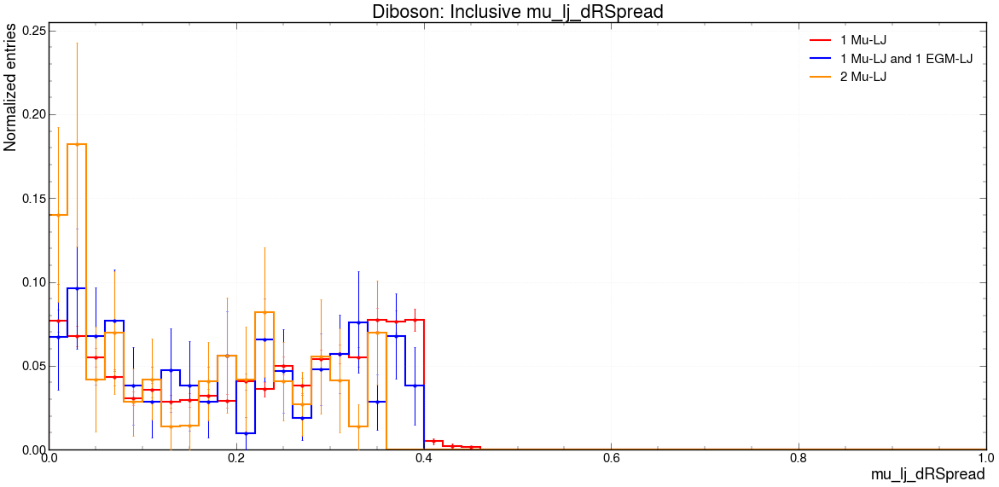

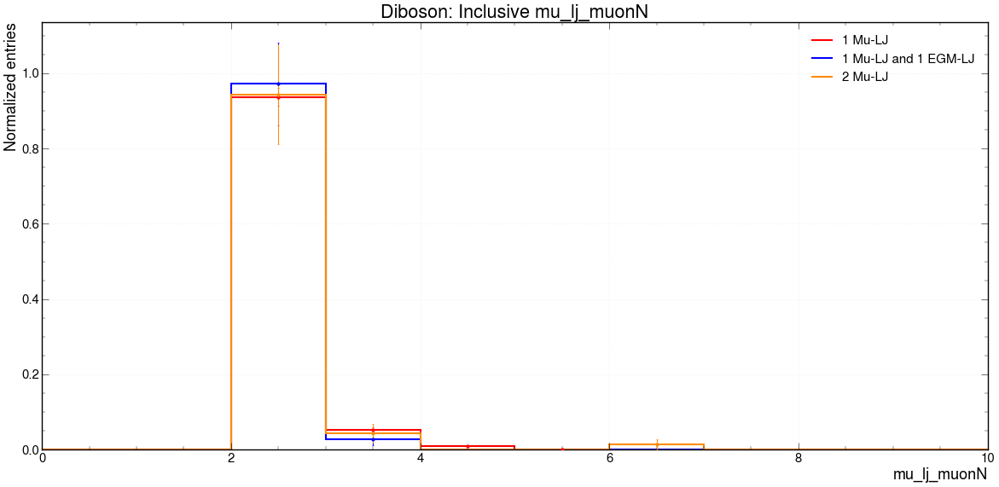

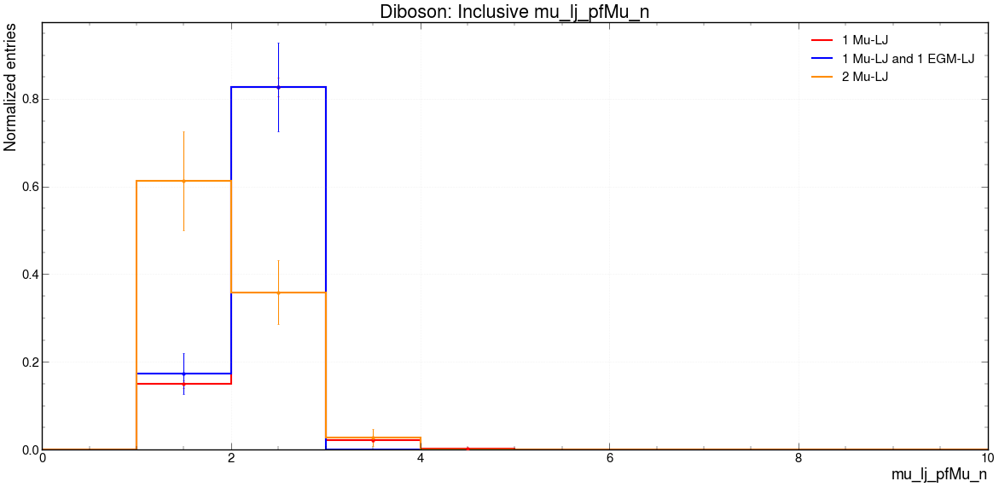

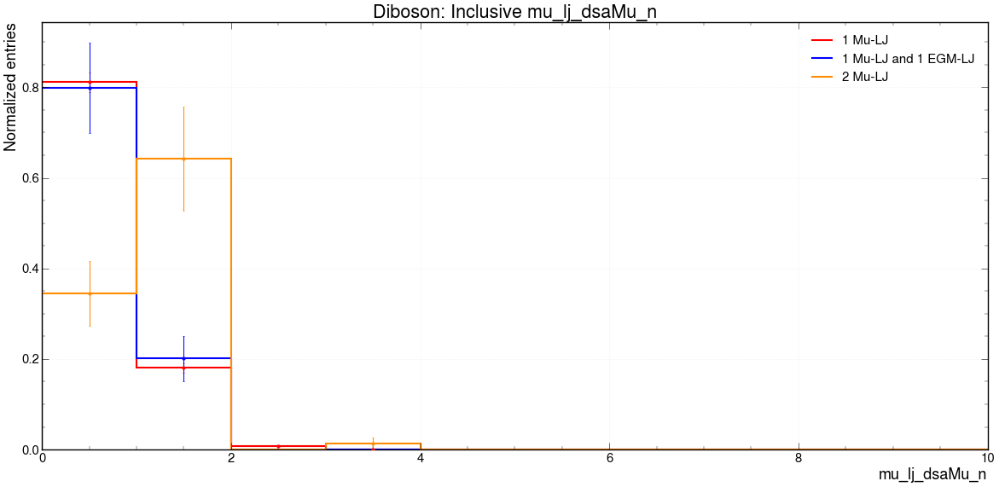

In [8]:
for group in background_groups:
    for variable in mu_lj_variables:
        plot_group_shape(
            mu_channels,
            group,
            variable,
            title=f'{group}: Inclusive {variable}',
            show_errors=True,
            **PLOT_OPTIONS.get(variable, {}),
        )


/tmp/ipykernel_3579/3446918125.py:247: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(24, 12))


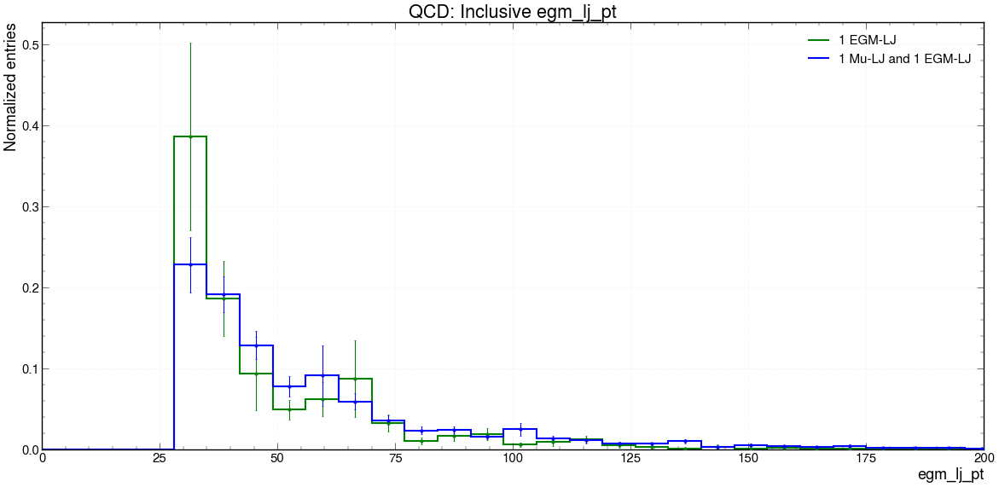

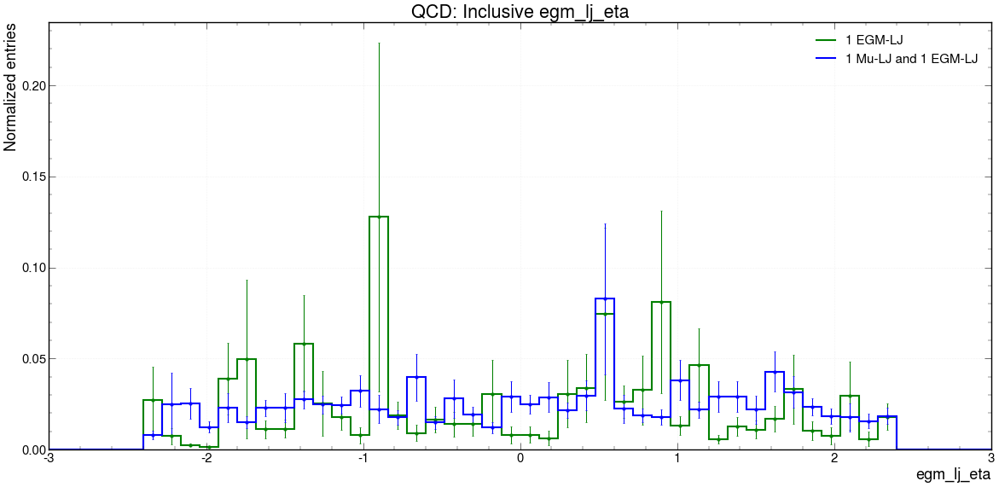

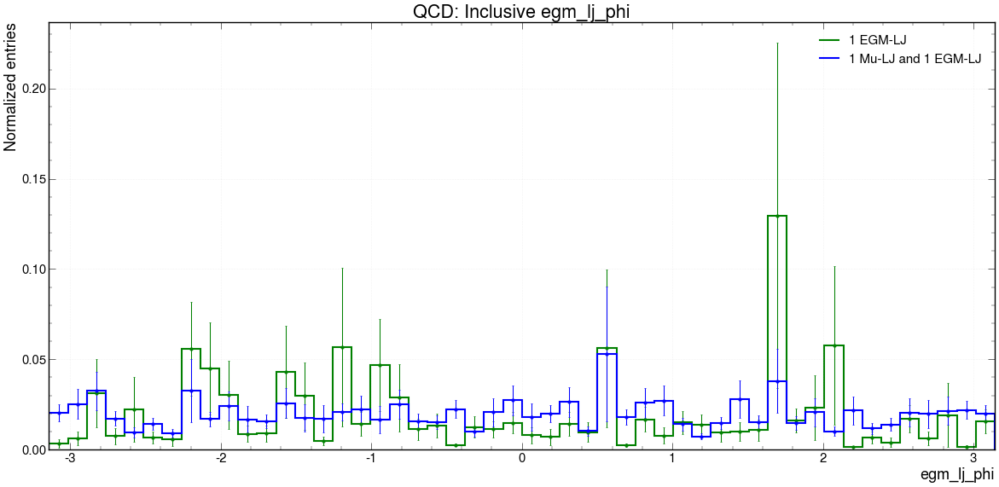

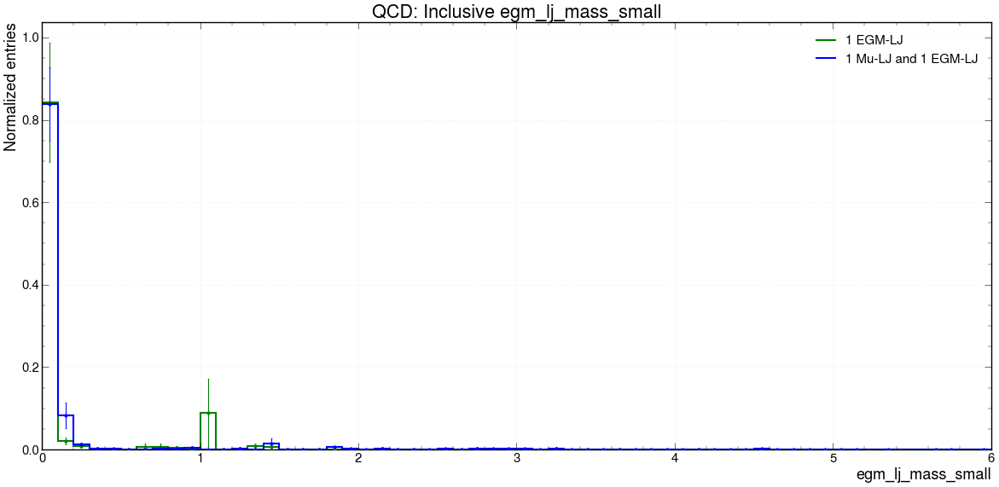

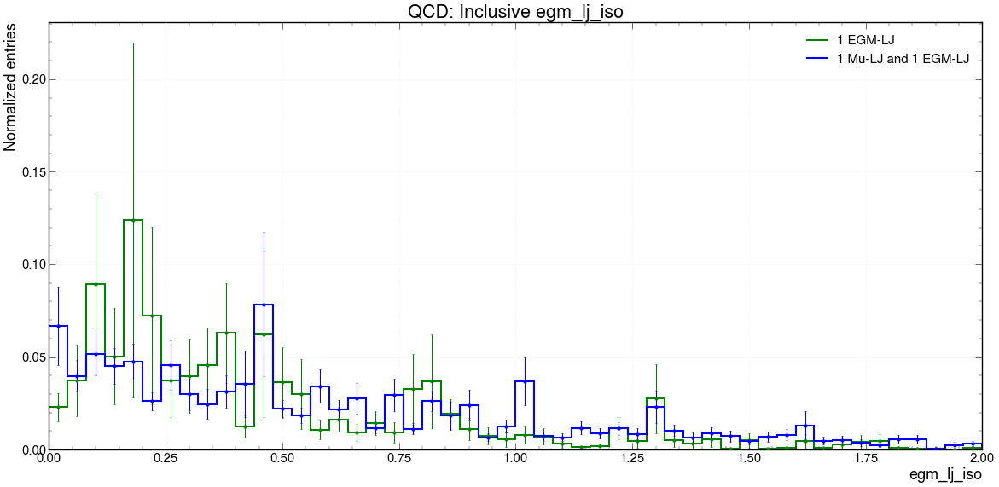

...

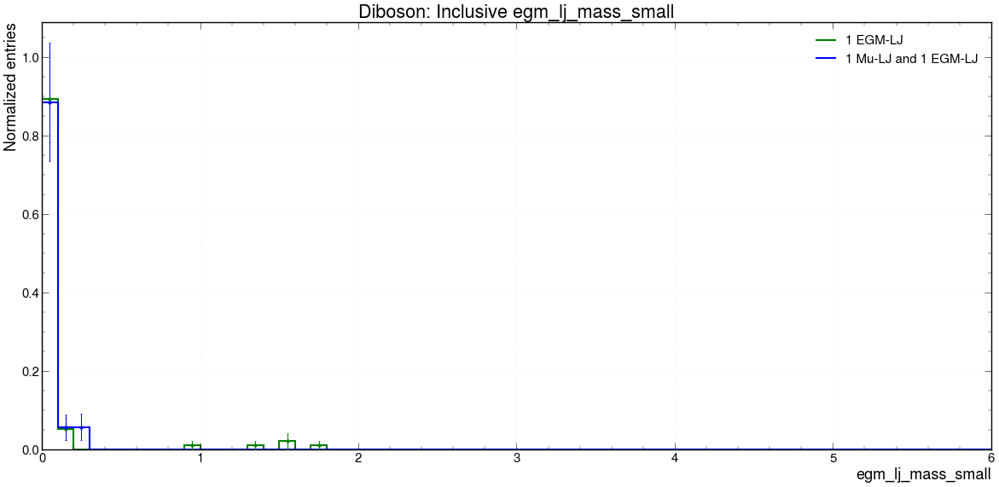

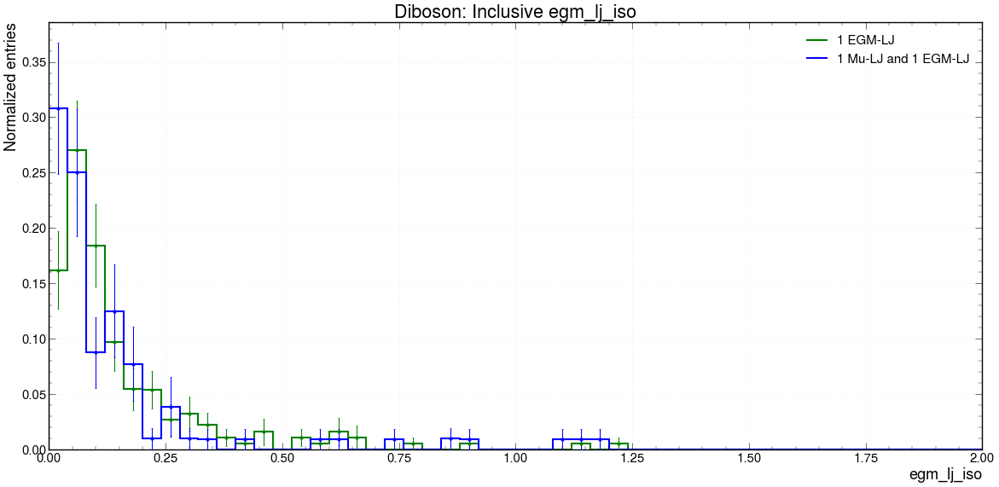

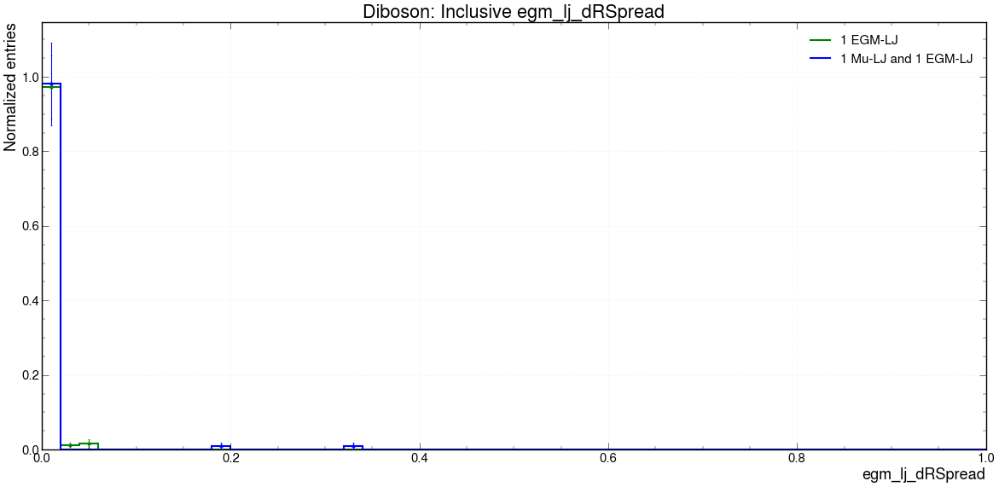

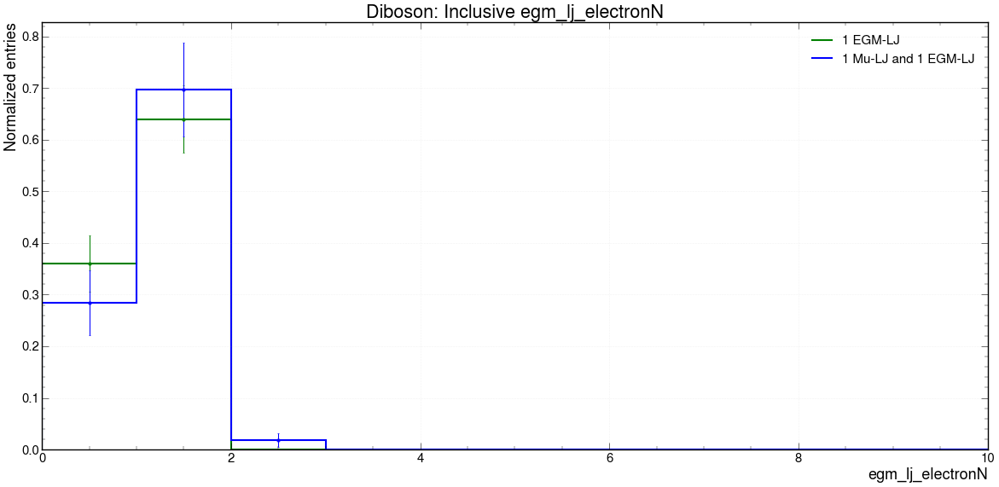

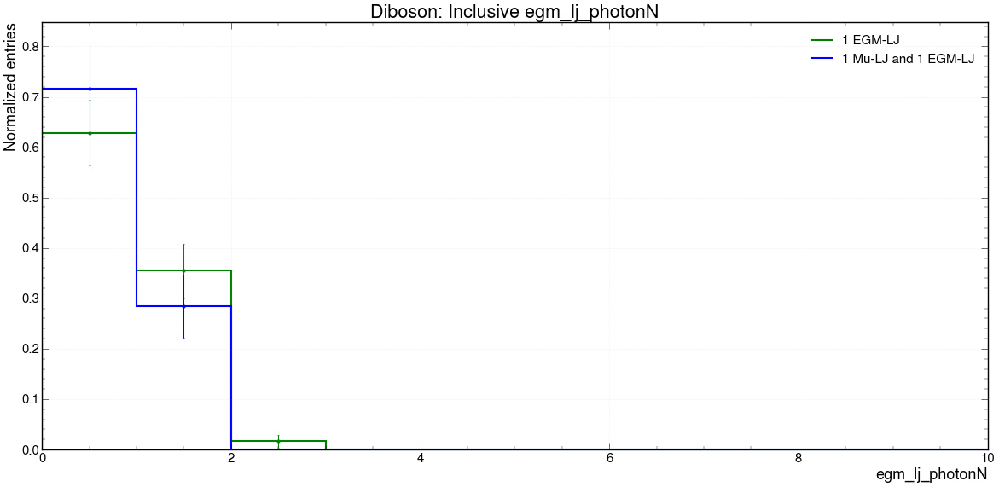

In [9]:
for group in background_groups:
    for variable in egm_lj_variables:
        plot_group_shape(
            egm_channels,
            group,
            variable,
            title=f'{group}: Inclusive {variable}',
            show_errors=True,
            **PLOT_OPTIONS.get(variable, {}),
        )


/tmp/ipykernel_3579/3446918125.py:383: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(24, 12))


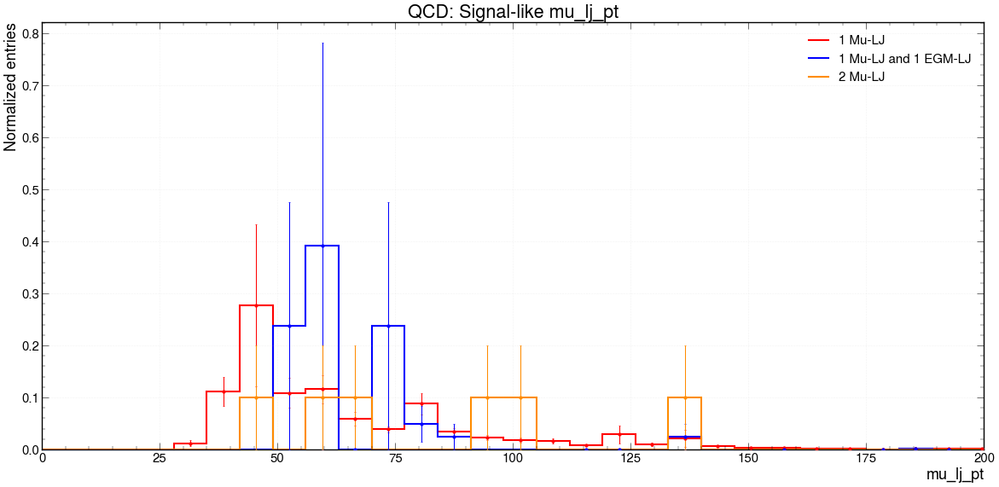

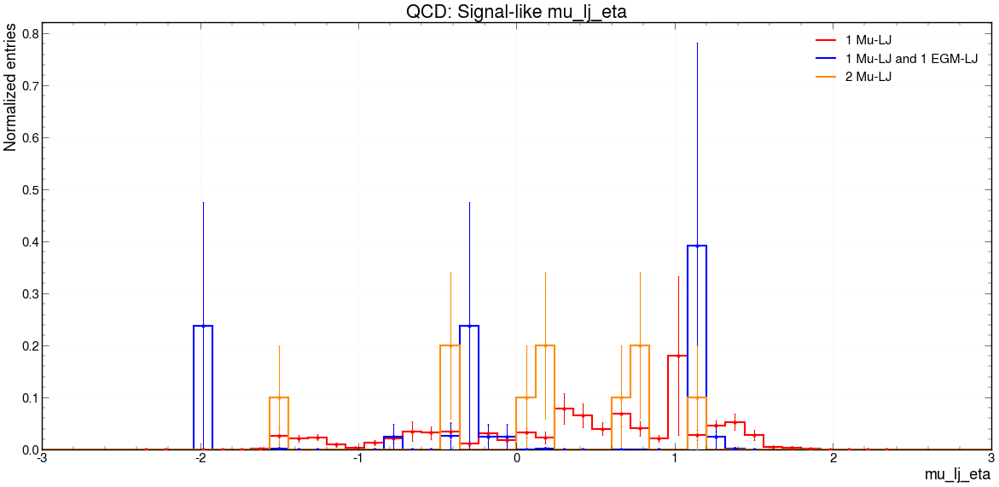

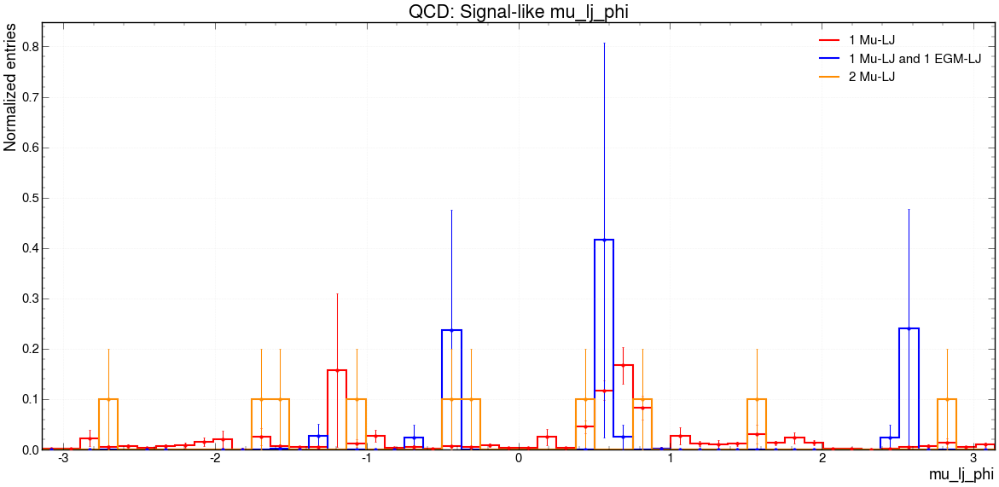

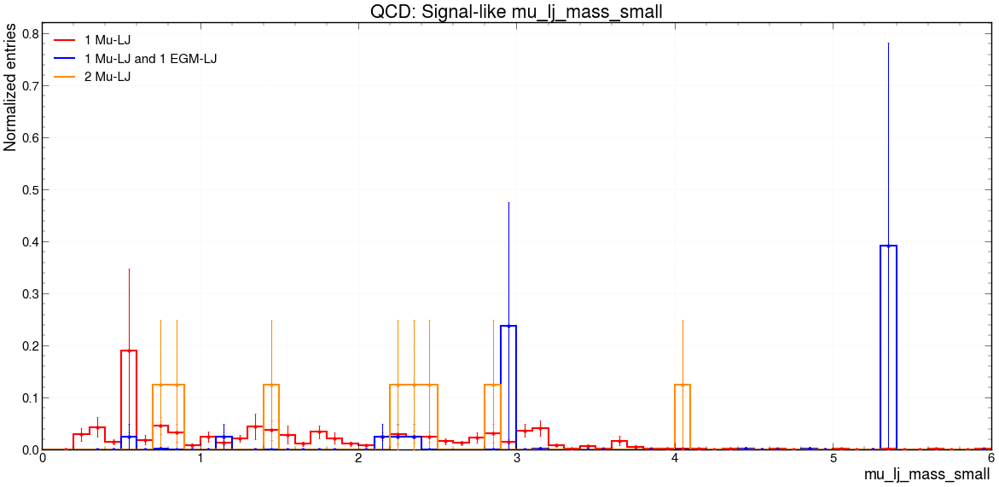

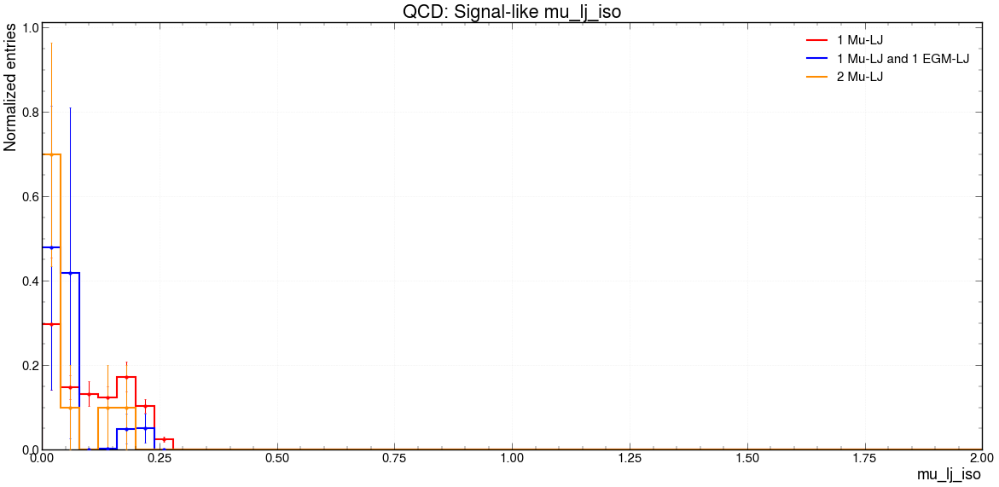

...

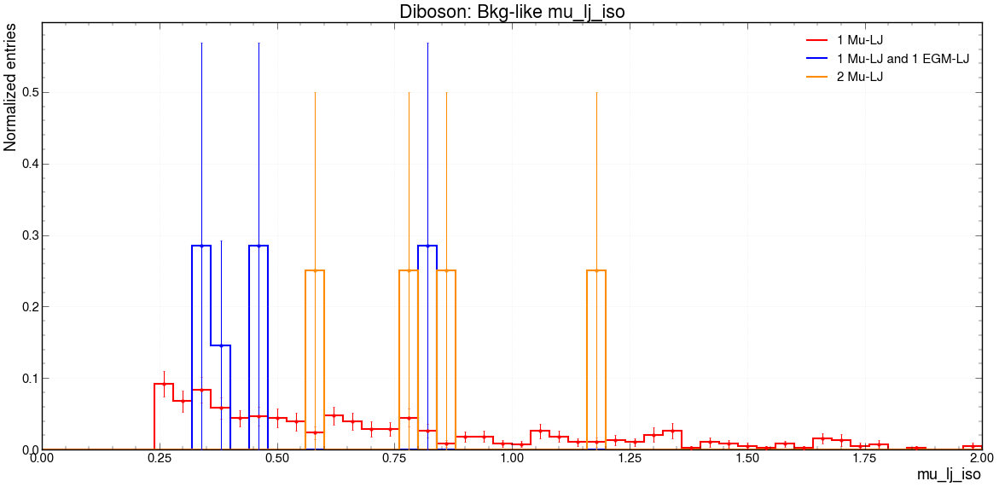

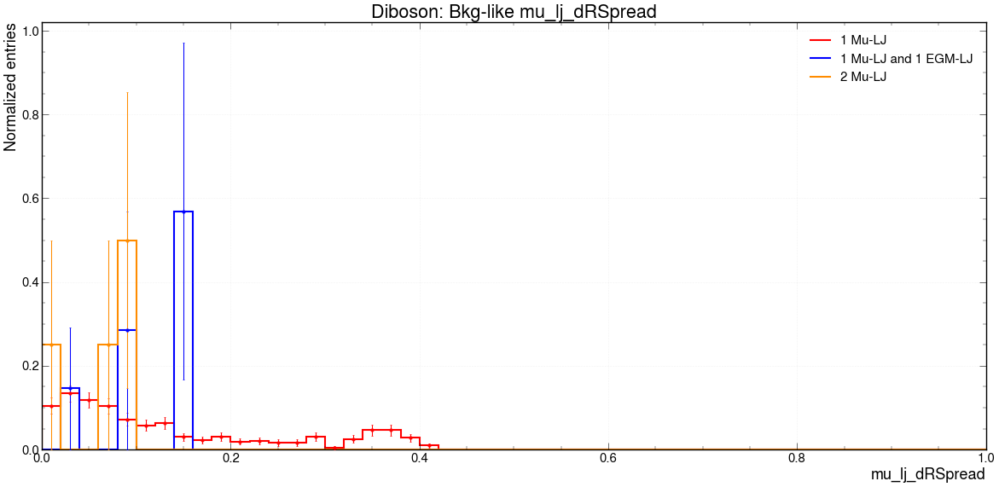

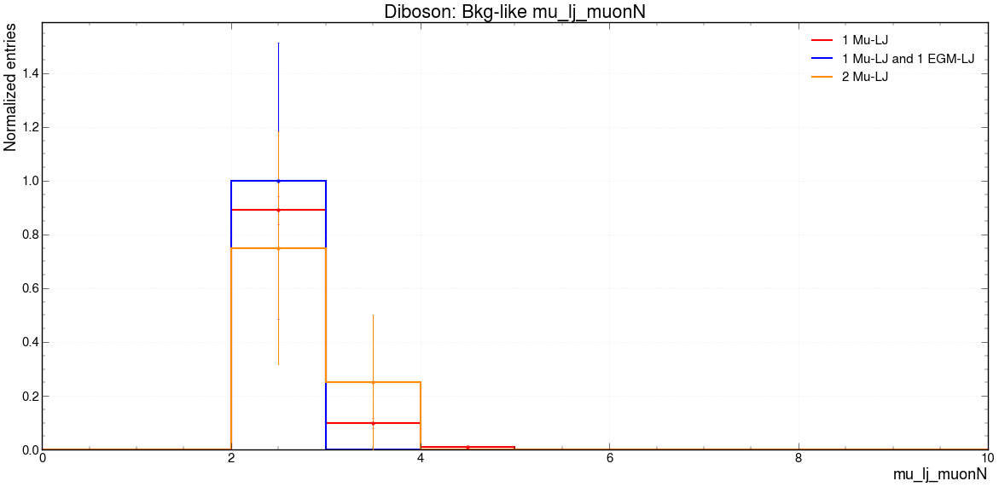

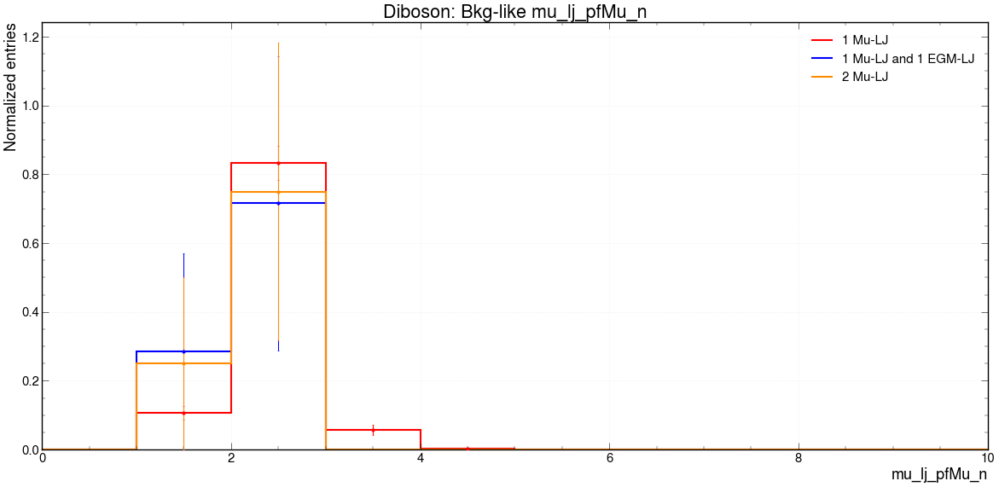

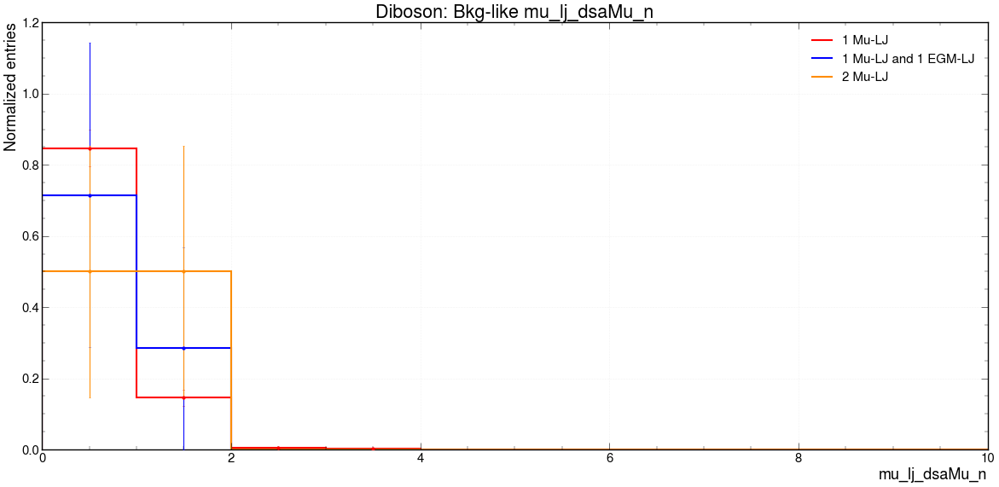

In [10]:
for region in ['both_pass', 'both_fail']:
    for group in background_groups:
        for variable in mu_lj_variables:
            plot_shape_for_region(
                mu_channels,
                background_groups[group],
                variable,
                region=region,
                title=f'{group}: {REGION_LABELS[region]} {variable}',
                show_errors=True,
                **PLOT_OPTIONS.get(variable, {}),
            )


/tmp/ipykernel_3579/3446918125.py:383: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(24, 12))


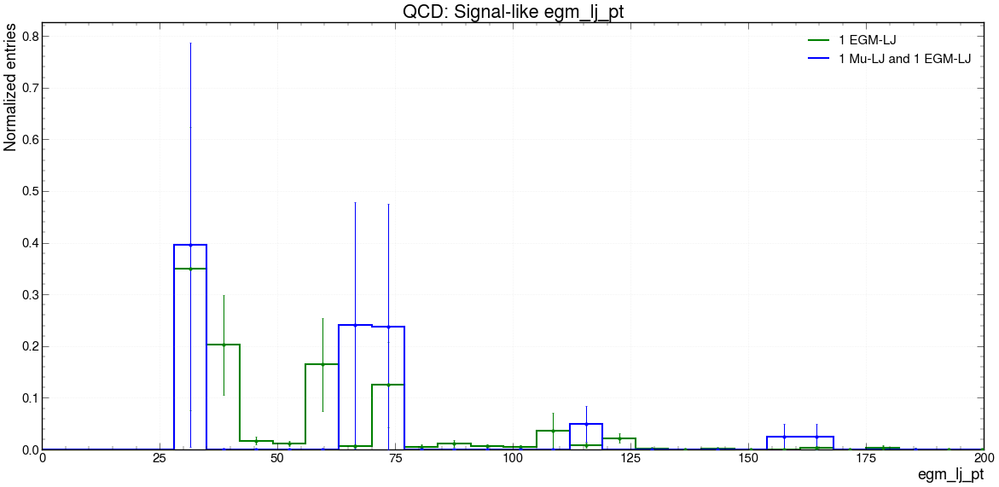

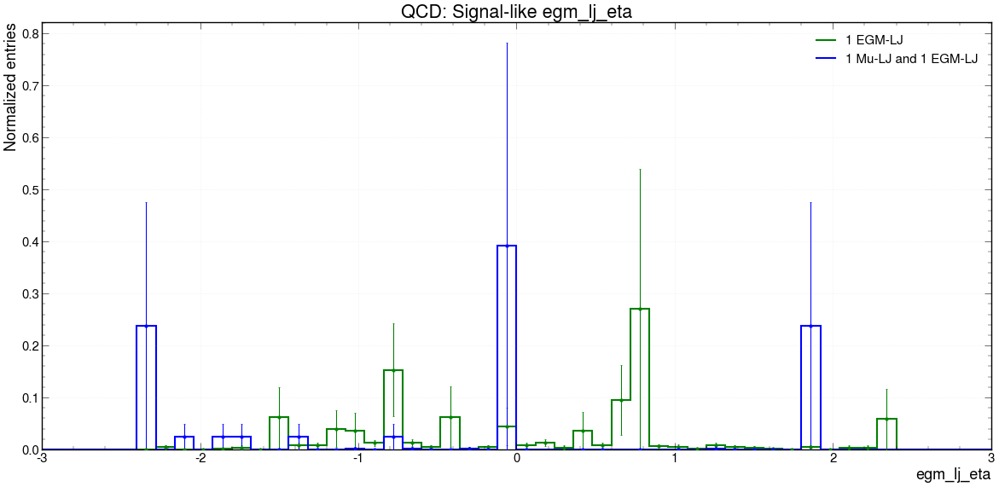

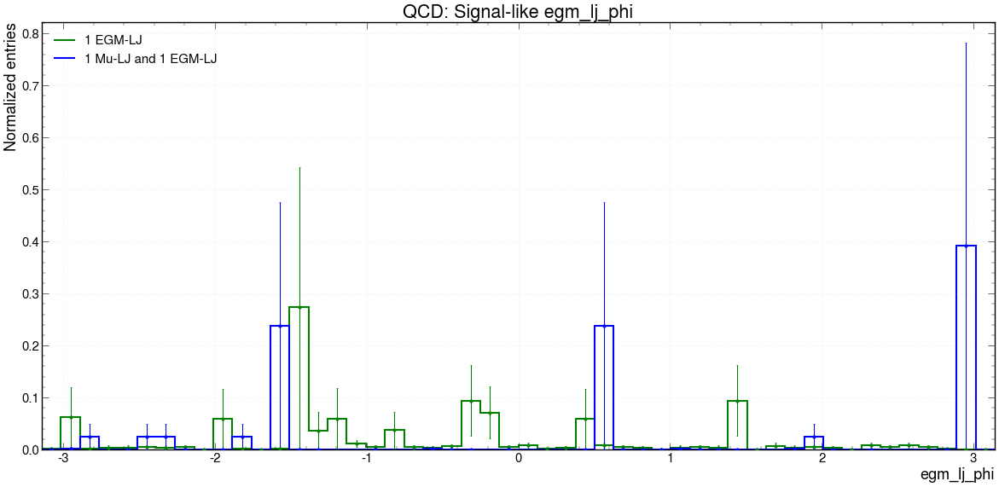

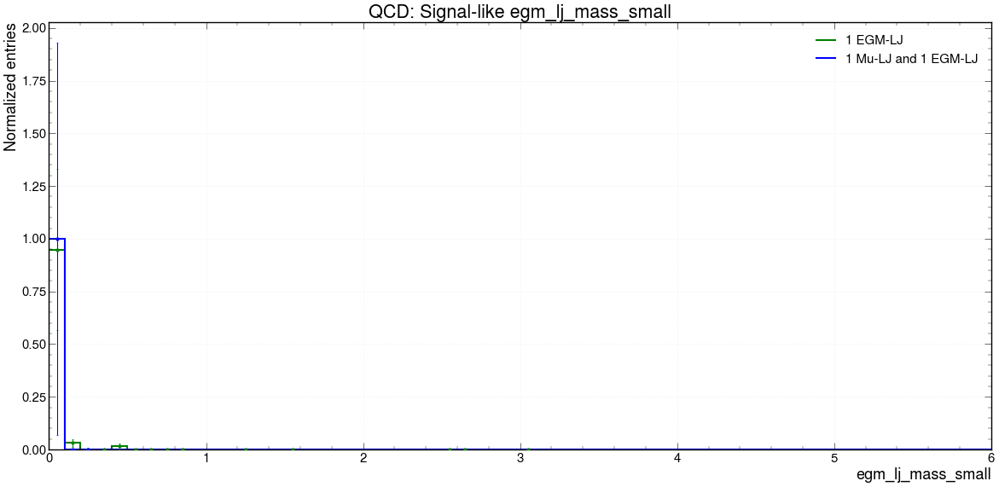

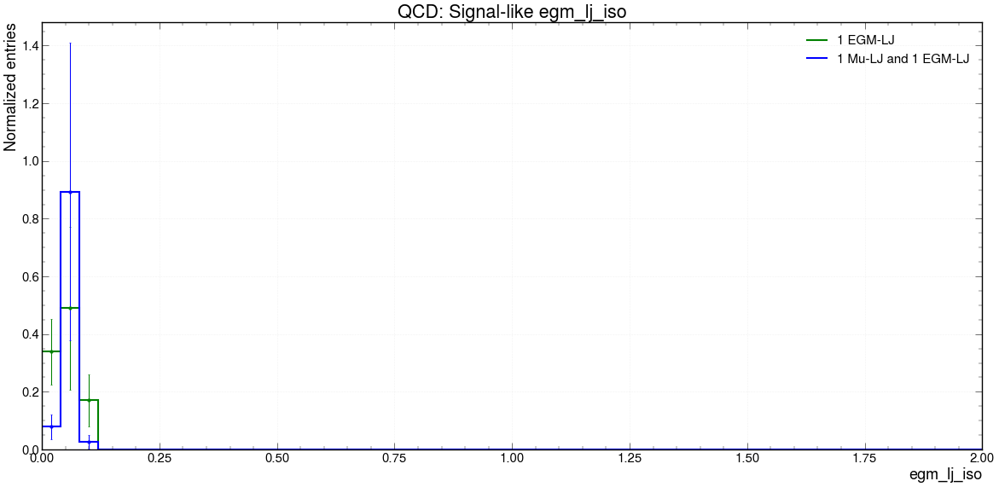

...

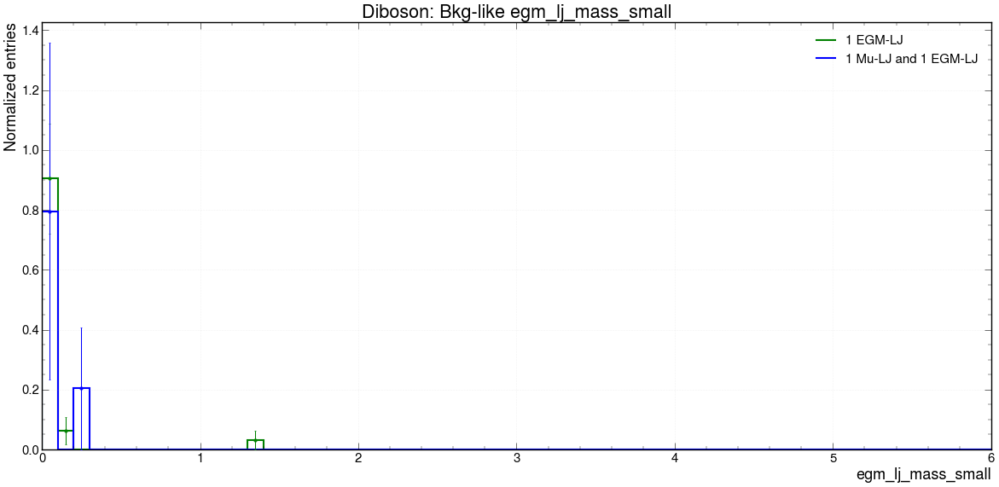

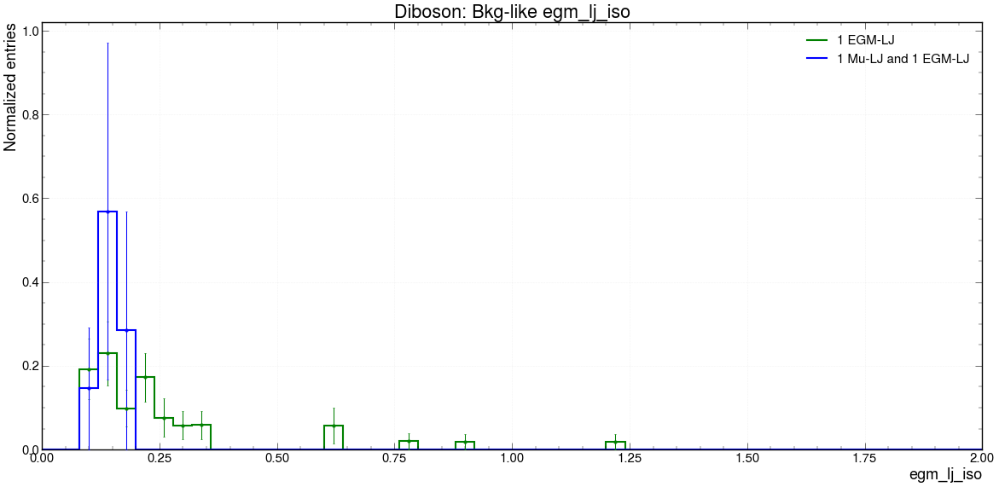

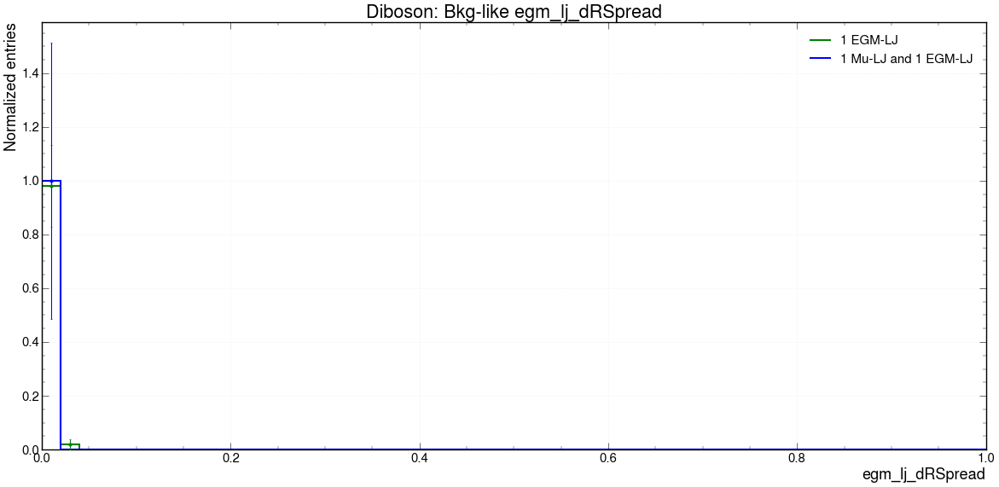

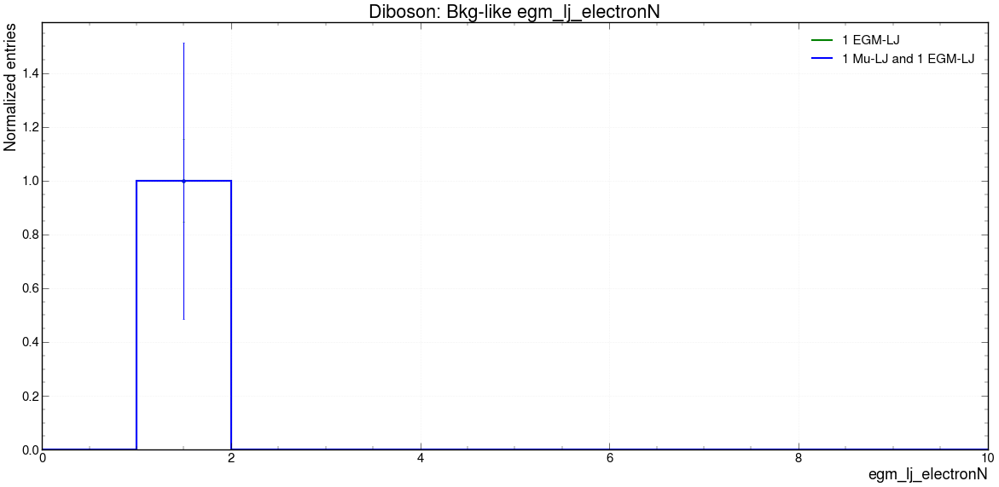

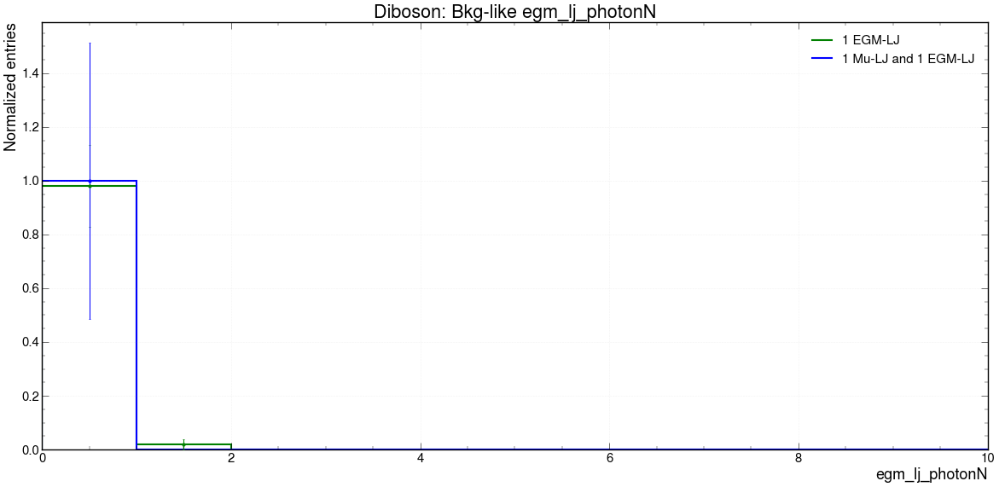

In [11]:
for region in ['both_pass', 'both_fail']:
    for group in background_groups:
        for variable in egm_lj_variables:
            plot_shape_for_region(
                egm_channels,
                background_groups[group],
                variable,
                region=region,
                title=f'{group}: {REGION_LABELS[region]} {variable}',
                show_errors=True,
                **PLOT_OPTIONS.get(variable, {}),
            )
